In [1]:
import tensorflow as tf
import pandas as pd
import numpy as np
import math
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import itertools
import random as python_random
from keras.initializers import GlorotUniform
from keras.initializers import Orthogonal
from keras.initializers import HeNormal
from keras.initializers import HeUniform
from keras.initializers import RandomNormal
from keras.regularizers import L1L2

np.random.seed(42)
tf.random.set_seed(42)
python_random.seed(42)

2024-06-08 21:51:32.889601: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-08 21:51:32.910071: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 21:51:32.910087: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 21:51:32.910646: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-08 21:51:32.914165: I tensorflow/core/platform/cpu_feature_guar

In [2]:
def load_data(filepath):
    return pd.read_csv(filepath, parse_dates=['Date'])

In [3]:
def create_sequences(data, target, n_steps):
    X, y = [], []
    # print("data", data[:15])
    # print("target", target[:15])
    for i in range(len(data) - n_steps):
        X.append(data[i:(i + n_steps)])
        y.append(target[i + n_steps])
    return np.array(X), np.array(y)

In [4]:
def modify_data(data):
    result = None
    # print(data)

    # copy LMCADY_acu_5d_log into a new column ACU_5D and shift it by 5 days
    data['ACU_5D'] = data['LMCADY_acu_5d_log']
    data['ACU_5D'] = data['ACU_5D'].shift(5)

    data['ACU_4D'] = data['LMCADY'].rolling(window=4).sum()
    data['ACU_3D'] = data['LMCADY'].rolling(window=3).sum()
    data['ACU_2D'] = data['LMCADY'].rolling(window=2).sum()

    data.dropna(inplace=True)
    data.reset_index(drop=True, inplace=True)

    result = data
    # print(result.head(10))
    return result

In [5]:
def prepare_data(df, target_column, n_steps, feature_list = []):

    df = modify_data(df)
    df.to_csv('../output/modified_data.csv', index=False)

    features = df.drop(columns=[target_column, 'LMCADY_std_5d_log'])
    features = features.drop(columns = ['Date'])
    features = features[feature_list]
    print("Features utilizados:",features.columns)

    target = df[target_column]

    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)
    X, y = create_sequences(features_scaled, target, n_steps)
    # for i in range(15):
    #     print(X[i][0][0], y[i])
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.05, shuffle = False)

    return X_train, X_test, y_train, y_test

In [6]:
def rmse(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_true - y_pred)))

In [7]:
def build_model(input_shape, md_prm: dict):
    model = Sequential()
    initializer = md_prm['initializer']  # Usando Orthogonal como inicializador

    # Añadiendo más capas LSTM y dropout
    # model.add(LSTM(md_prm['lstm_units1'], return_sequences=True, input_shape=input_shape, kernel_initializer=initializer))#, activation='relu', dropout=0.15))
    # model.add(LSTM(md_prm['lstm_units2'], return_sequences=True, kernel_initializer=initializer))#, activation='relu', dropout=0.15))
    # model.add(LSTM(md_prm['lstm_units2'], kernel_initializer=initializer))#, activation='relu'))  # Capa adicional LSTM
    # model.add(Dense(50, activation='relu', kernel_initializer=initializer))  # Capa Dense adicional
    # model.add(Dense(1, kernel_initializer=initializer))

    model.add(LSTM(md_prm['lstm_units1'], return_sequences=True, input_shape=input_shape, kernel_initializer=initializer, dropout=md_prm['dropout']))#, kernel_regularizer=regularizer))
    model.add(LSTM(md_prm['lstm_units2'], kernel_initializer=initializer,dropout=md_prm['dropout']))#, kernel_regularizer=regularizer))
    model.add(Dense(1, kernel_initializer=initializer))

    model.compile(optimizer=Adam(learning_rate=0.0001), loss='mean_squared_error', metrics=[rmse])
    return model


In [8]:
def train_model(model, X_train, y_train, epochs, batch_size, verbose):

    early_stopping = EarlyStopping(
        monitor             ='val_loss',
        patience            =75,
        verbose             =1,
        restore_best_weights=True
    )

    history = model.fit(
        X_train, y_train,
        epochs              =epochs,
        batch_size          =batch_size,
        verbose             =verbose,
        callbacks           =[early_stopping],
        validation_split    =0.05
    )

    return history

In [9]:
def evaluate_model(model, X_test, y_test):
    return model.evaluate(X_test, y_test)

In [10]:
def plot_predictions(y_true, y_pred, n=-1, title="Prediction vs Actual Data", markersize=3, rmse=None):
    if n != -1:
        n = min(n, len(y_true), len(y_pred))

        y_true = y_true[-n:]
        y_pred = y_pred[-n:]

    plt.figure(figsize=(18, 2.5))
    plt.plot(y_true, label='Actual Values', marker='o', linestyle='-', markersize=markersize)

    # Plot the RMSE lines if rmse is provided
    if rmse is not None:
        plt.axhline(y= rmse, color='green', linestyle='--', linewidth=0.7)
        plt.axhline(y=-rmse, color='green', linestyle='--', linewidth=0.7)

        tot_pred = 0
        prof = 0
        loss = 0

        # plot green markers beyond the rmse range
        for i in range(len(y_pred)):
            if (y_pred[i] > rmse or y_pred[i] < - rmse):
                # print("{} {}".format(y_pred[i],y_true[i]))
                if (y_true[i] > 0 and y_pred[i] > 0) or (y_true[i] < 0 and y_pred[i] < 0):
                    plt.plot(i, y_pred[i], 'gx', markersize=markersize+1)
                    prof += 1
                else:
                    plt.plot(i, y_pred[i], 'rx', markersize=markersize+1)
                    loss += 1
                tot_pred += 1
            else:
                plt.plot(i, y_pred[i], marker='x', color='orange', markersize=markersize-1)

    else:
        plt.plot(y_true, label='Actual Values'   , marker='o', linestyle='-' , markersize=markersize)
        plt.plot(y_pred, label='Predicted Values', marker='x', linestyle='--', markersize=markersize)

    plt.axhline(y=0, color='gray', linestyle='--', linewidth=0.7)

    plt.title(title)
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

    return tot_pred, prof, loss

In [11]:
def trend_accuracy(y_true, y_pred):
    trend_up_true = 0
    trend_down_true = 0
    trend_up_pred = 0
    trend_down_pred = 0

    for j in range(len(y_true)-1):
        if y_true[j] > 0.0:
            trend_up_pred += 1
            if y_pred[j] > 0.0:
                trend_up_true += 1
        if y_true[j] < 0.0:
            trend_down_pred += 1
            if y_pred[j] < 0.0:
                trend_down_true += 1

    trend_true = trend_up_true + trend_down_true
    trend_pred = trend_up_pred + trend_down_pred

    trend_up_accuracy = trend_up_true/trend_up_pred
    trend_down_accuracy = trend_down_true/trend_down_pred
    trend_accuracy = trend_true/trend_pred

    return trend_accuracy, trend_up_accuracy, trend_down_accuracy

In [12]:
n_steps_options     = [40,60,120]
batch_size_options  = [256,128]
epochs_options      = [300]

lstm_units_options1 = [75,25]
lstm_units_options2 = [25]
initializer         = [ 
                        GlorotUniform(seed=42), 
                        # HeNormal(seed=42), 
                        # HeUniform(seed=42), 
                        Orthogonal(seed=42)
                        ]
activation_options  = ['relu']
dropout_options     = [.15]
num_layers_options  = [2]

# # caso seleccionado
# n_steps_options     = [120]
# batch_size_options  = [256]
# epochs_options      = [300]

# lstm_units_options  = [25]
# activation_options  = ['relu']
# dropout_options     = [.15]
# num_layers_options  = [2]

# variable_options = ['LMCADS03','LMCADY','SPX','MXWD','XAU','XAG','ACU_5D','ACU_4D','ACU_3D','ACU_2D']
# modified_lists = [variable_options[:i] + variable_options[i+1:] for i in range(len(variable_options))]
# print(modified_lists)
modified_lists = [['LMCADS03','LMCADY','SPX','MXWD','XAG','XAU','ACU_5D','ACU_4D','ACU_3D','ACU_2D']]

# combinations
model_params_combinations = list(itertools.product(
    n_steps_options     ,
    lstm_units_options1,
    lstm_units_options2,
    initializer        ,
    activation_options,
    dropout_options,
    num_layers_options,
    batch_size_options,
    epochs_options,
    modified_lists
))
target_column = 'LMCADY_acu_5d_log'

In [13]:
n_iterations = len(model_params_combinations)
print("Total iterations: {}".format(n_iterations))

Total iterations: 24


In [14]:
def run_model_iterations():
    top_results = []
    i = 1
    for params in model_params_combinations:
        n_steps, lstm_units1, lstm_units2, initializer, activation, dropout, num_layers, batch_size, epochs, var_options = params
        try:

            # data load
            df = load_data("../input/copper_log_returns_5d_final.csv")
            print("\nIteration {}/{}".format(i, n_iterations))
            # print("Params: n_steps: {}, lstm_units1: {}, lstm_units2: {}, activation: {}, dropout: {}, num_layers: {}".format(
            #     n_steps, lstm_units1, lstm_units2, activation, dropout, num_layers)
            # )

            print("Train : batch    > {}".format(batch_size))
            print("        epochs   > {}".format(epochs))
            print("        n_steps  > {}".format(n_steps))
            
            # data preparation
            # print("Variables used: {}".format(var_options))
            X_train, X_test, y_train, y_test = prepare_data(df, target_column, n_steps, var_options)

            # build model
            model_params = {
                'lstm_units1'   : lstm_units1,
                'lstm_units2'   : lstm_units2,
                'activation'    : activation,
                'dropout'       : dropout,
                'num_layers'    : num_layers,
                'initializer'   : initializer
            }
            print("Model params: \n{}".format(model_params))

            input_shape = (X_train.shape[1], X_train.shape[2])
            print("Input shape: {}".format(input_shape))
            model = build_model(input_shape, model_params)
            print(model.summary())

            # model train
            if True:
                history = train_model(model, X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=2)

                # model evaluation
                y_pred      = model.predict(X_test)
                rmse_score  = math.sqrt(mean_squared_error(y_test, y_pred))
                std_dev     = np.std(y_test)

                print("Pred std dev: {:.6f}, test std dev: {:.6f}".format(np.std(y_pred), std_dev))

                if rmse_score < std_dev:
                    diff = rmse_score - std_dev + abs(np.std(y_pred) - std_dev)/4.0
                else:
                    diff = (rmse_score - std_dev) + abs(np.std(y_pred) - std_dev)/2.0

                # diff = (rmse_score - std_dev) + abs(np.std(y_pred) - std_dev)/2.0
                tren_acc, trend_up, trend_down = trend_accuracy(y_test, y_pred)
                result = {
                    'md_prm'    : model_params,
                    'n_steps'   : n_steps,
                    'batch_size': batch_size,
                    'epochs'    : epochs,
                    'rmse'      : rmse_score,
                    'std_dev'   : std_dev,
                    'diff'      : diff,
                    'predictions': y_pred,
                    'true_values': y_test,
                    'feature_list': var_options,
                    'tr_ac': tren_acc,
                    'tr_up': trend_up,
                    'tr_down': trend_down
                }

                print("RMSE: {:.6f}, STD_DEV: {:.6f}, STD_PRD: {:.6f}, OBJDIFF: {:.6f}, RDIFF: {:.6f}".format(rmse_score, std_dev, np.std(y_pred), diff, (rmse_score - std_dev)))
                print("Trend: {:.2f}, Up: {:.2f}, Down: {:.2f}".format(tren_acc*100, trend_up*100, trend_down*100))

                top_results.append(result)
                top_results = sorted(top_results, key=lambda x: x['diff'])
                tot_pred, prof, loss = plot_predictions(result['true_values'], result['predictions'], -1, title="It. {}".format(i),rmse = rmse_score)
                print("Total TH Pred.: {}".format(tot_pred))
                if tot_pred != 0:
                    print("TH Pred. acc. : {:.2f}".format(prof*100.0/tot_pred))

            print("Completed Iteration {}/{}".format(i, n_iterations))
        except Exception as ex:
            print(f"An error occurred: {ex}. Skipping this combination.")
        i += 1
    return top_results


Iteration 1/24
Train : batch    > 256
        epochs   > 300
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Input shape: (40, 10)


2024-06-08 21:51:34.115944: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-08 21:51:34.135497: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-08 21:51:34.135650: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 40, 75)            25800     
                                                                 
 lstm_1 (LSTM)               (None, 25)                10100     
                                                                 
 dense (Dense)               (None, 1)                 26        
                                                                 
Total params: 35926 (140.34 KB)
Trainable params: 35926 (140.34 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
Epoch 1/300


2024-06-08 21:51:37.402005: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8902


 1/20 [>.............................] - ETA: 53s - loss: 0.0042 - rmse: 0.0646

2024-06-08 21:51:37.730171: I external/local_xla/xla/service/service.cc:168] XLA service 0x711e54051130 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-06-08 21:51:37.730186: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3080, Compute Capability 8.6
2024-06-08 21:51:37.732926: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1717901497.783036 2099112 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


20/20 [==============================] - 3s 32ms/step - loss: 0.0033 - rmse: 0.0568 - val_loss: 0.0015 - val_rmse: 0.0343
Epoch 2/300
20/20 [==============================] - 0s 18ms/step - loss: 0.0022 - rmse: 0.0468 - val_loss: 0.0013 - val_rmse: 0.0287
Epoch 3/300
20/20 [==============================] - 0s 18ms/step - loss: 0.0020 - rmse: 0.0440 - val_loss: 0.0012 - val_rmse: 0.0279
Epoch 4/300
20/20 [==============================] - 0s 18ms/step - loss: 0.0019 - rmse: 0.0432 - val_loss: 0.0012 - val_rmse: 0.0295
Epoch 5/300
20/20 [==============================] - 0s 18ms/step - loss: 0.0018 - rmse: 0.0426 - val_loss: 0.0012 - val_rmse: 0.0313
Epoch 6/300
20/20 [==============================] - 0s 18ms/step - loss: 0.0018 - rmse: 0.0416 - val_loss: 0.0012 - val_rmse: 0.0334
Epoch 7/300
20/20 [==============================] - 0s 18ms/step - loss: 0.0017 - rmse: 0.0413 - val_loss: 0.0012 - val_rmse: 0.0310
Epoch 8/300
20/20 [==============================] - 0s 18ms/step - loss: 

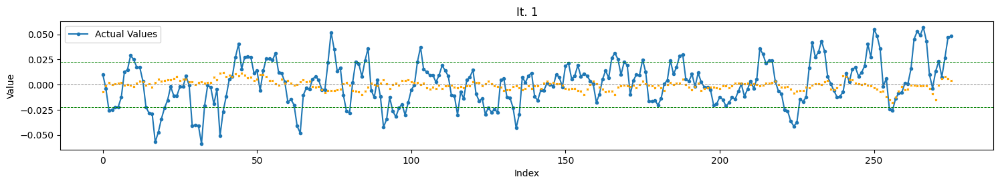

Total TH Pred.: 0
Completed Iteration 1/24

Iteration 2/24
Train : batch    > 128
        epochs   > 300
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Input shape: (40, 10)
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, 40, 75)            25800     
                                                                 
 lstm_3 (LSTM)               (None, 25)                10100     
                                                                 
 dense_1 (Dense)             (None, 1)                 26        
               

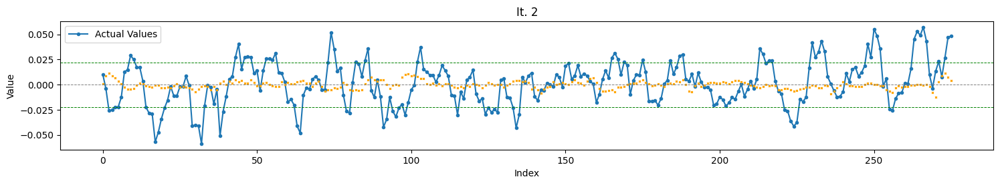

Total TH Pred.: 0
Completed Iteration 2/24

Iteration 3/24
Train : batch    > 256
        epochs   > 300
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Input shape: (40, 10)
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 40, 75)            25800     
                                                                 
 lstm_5 (LSTM)               (None, 25)                10100     
                                                                 
 dense_2 (Dense)             (None, 1)                 26        
                  

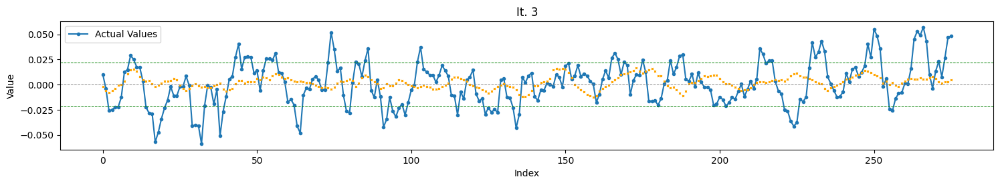

Total TH Pred.: 0
Completed Iteration 3/24

Iteration 4/24
Train : batch    > 128
        epochs   > 300
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Input shape: (40, 10)
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 40, 75)            25800     
                                                                 
 lstm_7 (LSTM)               (None, 25)                10100     
                                                                 
 dense_3 (Dense)             (None, 1)                 26        
                  

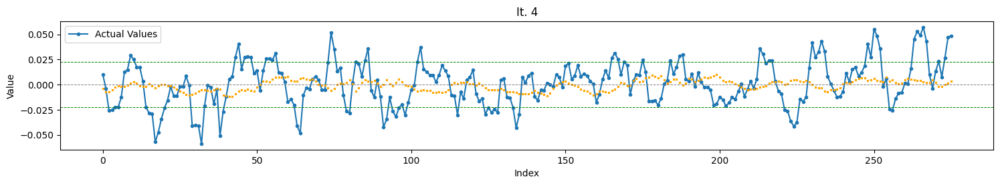

Total TH Pred.: 0
Completed Iteration 4/24

Iteration 5/24
Train : batch    > 256
        epochs   > 300
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Input shape: (40, 10)
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 40, 25)            3600      
                                                                 
 lstm_9 (LSTM)               (None, 25)                5100      
                                                                 
 dense_4 (Dense)             (None, 1)                 26        
               

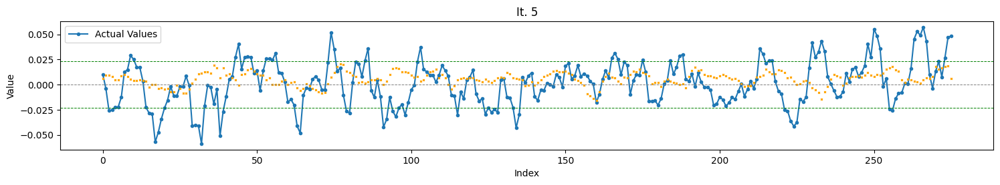

Total TH Pred.: 0
Completed Iteration 5/24

Iteration 6/24
Train : batch    > 128
        epochs   > 300
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Input shape: (40, 10)
Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (None, 40, 25)            3600      
                                                                 
 lstm_11 (LSTM)              (None, 25)                5100      
                                                                 
 dense_5 (Dense)             (None, 1)                 26        
               

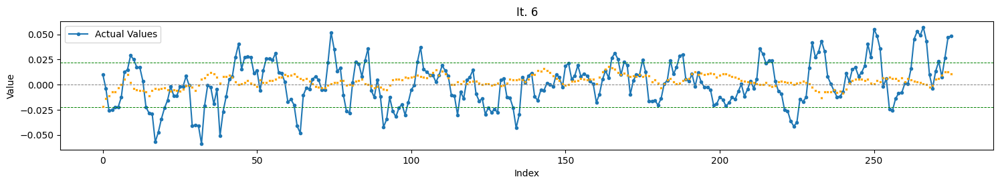

Total TH Pred.: 0
Completed Iteration 6/24

Iteration 7/24
Train : batch    > 256
        epochs   > 300
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Input shape: (40, 10)
Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_12 (LSTM)              (None, 40, 25)            3600      
                                                                 
 lstm_13 (LSTM)              (None, 25)                5100      
                                                                 
 dense_6 (Dense)             (None, 1)                 26        
                  

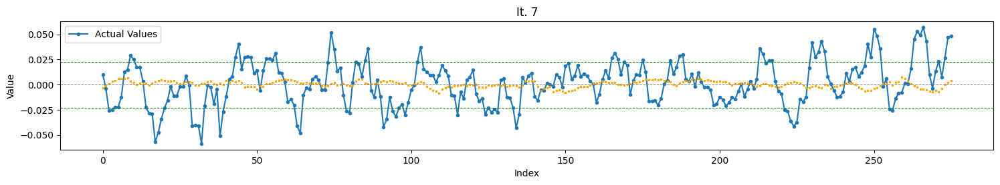

Total TH Pred.: 0
Completed Iteration 7/24

Iteration 8/24
Train : batch    > 128
        epochs   > 300
        n_steps  > 40
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Input shape: (40, 10)
Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_14 (LSTM)              (None, 40, 25)            3600      
                                                                 
 lstm_15 (LSTM)              (None, 25)                5100      
                                                                 
 dense_7 (Dense)             (None, 1)                 26        
                  

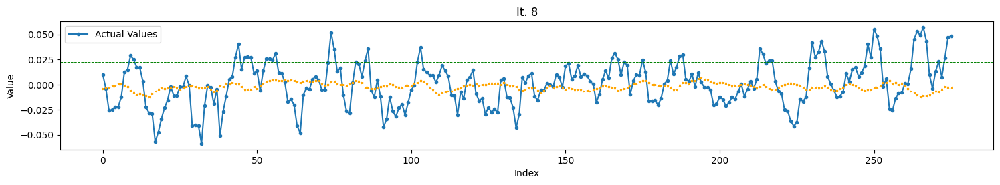

Total TH Pred.: 0
Completed Iteration 8/24

Iteration 9/24
Train : batch    > 256
        epochs   > 300
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Input shape: (60, 10)
Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_16 (LSTM)              (None, 60, 75)            25800     
                                                                 
 lstm_17 (LSTM)              (None, 25)                10100     
                                                                 
 dense_8 (Dense)             (None, 1)                 26        
               

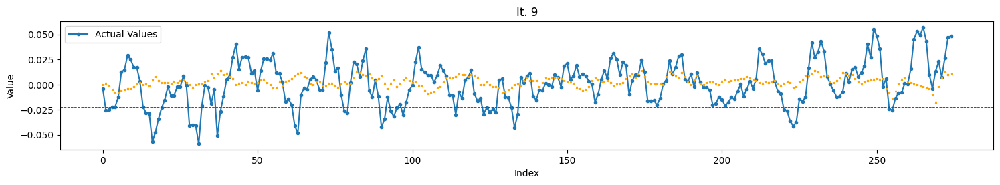

Total TH Pred.: 0
Completed Iteration 9/24

Iteration 10/24
Train : batch    > 128
        epochs   > 300
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Input shape: (60, 10)
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_18 (LSTM)              (None, 60, 75)            25800     
                                                                 
 lstm_19 (LSTM)              (None, 25)                10100     
                                                                 
 dense_9 (Dense)             (None, 1)                 26        
              

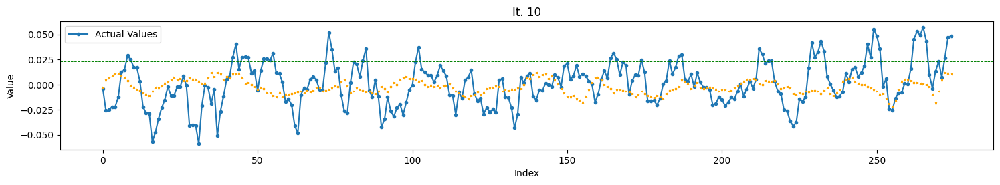

Total TH Pred.: 0
Completed Iteration 10/24

Iteration 11/24
Train : batch    > 256
        epochs   > 300
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Input shape: (60, 10)
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_20 (LSTM)              (None, 60, 75)            25800     
                                                                 
 lstm_21 (LSTM)              (None, 25)                10100     
                                                                 
 dense_10 (Dense)            (None, 1)                 26        
               

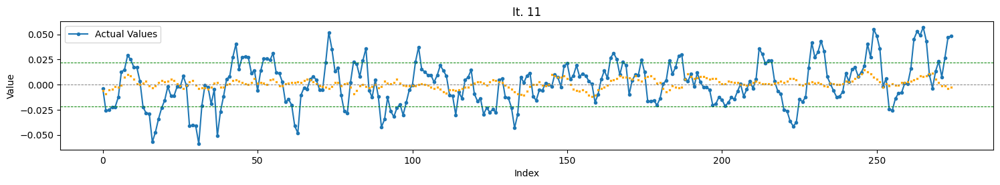

Total TH Pred.: 0
Completed Iteration 11/24

Iteration 12/24
Train : batch    > 128
        epochs   > 300
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Input shape: (60, 10)
Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_22 (LSTM)              (None, 60, 75)            25800     
                                                                 
 lstm_23 (LSTM)              (None, 25)                10100     
                                                                 
 dense_11 (Dense)            (None, 1)                 26        
               

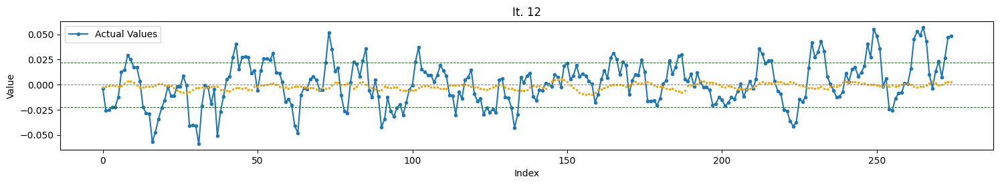

Total TH Pred.: 0
Completed Iteration 12/24

Iteration 13/24
Train : batch    > 256
        epochs   > 300
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Input shape: (60, 10)
Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_24 (LSTM)              (None, 60, 25)            3600      
                                                                 
 lstm_25 (LSTM)              (None, 25)                5100      
                                                                 
 dense_12 (Dense)            (None, 1)                 26        
            

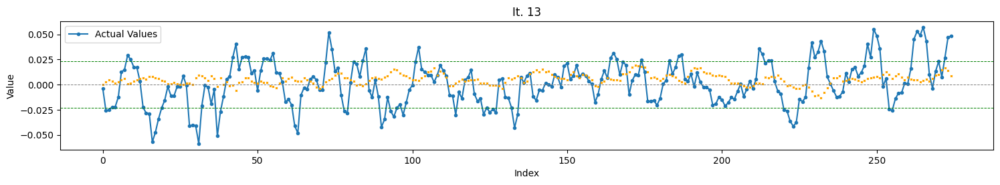

Total TH Pred.: 0
Completed Iteration 13/24

Iteration 14/24
Train : batch    > 128
        epochs   > 300
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Input shape: (60, 10)
Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_26 (LSTM)              (None, 60, 25)            3600      
                                                                 
 lstm_27 (LSTM)              (None, 25)                5100      
                                                                 
 dense_13 (Dense)            (None, 1)                 26        
            

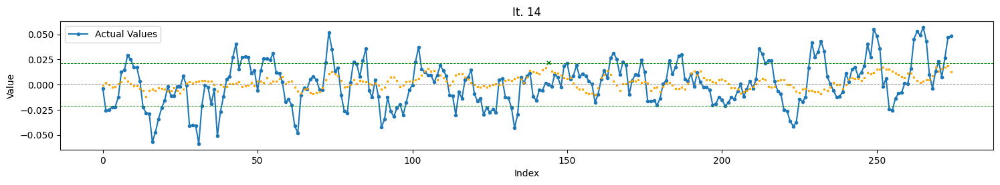

Total TH Pred.: 1
TH Pred. acc. : 100.00
Completed Iteration 14/24

Iteration 15/24
Train : batch    > 256
        epochs   > 300
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Input shape: (60, 10)
Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_28 (LSTM)              (None, 60, 25)            3600      
                                                                 
 lstm_29 (LSTM)              (None, 25)                5100      
                                                                 
 dense_14 (Dense)            (None, 1)                 26 

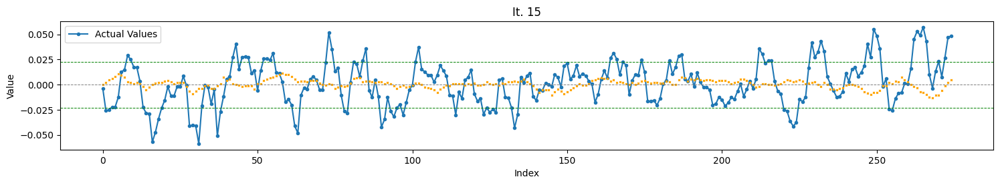

Total TH Pred.: 0
Completed Iteration 15/24

Iteration 16/24
Train : batch    > 128
        epochs   > 300
        n_steps  > 60
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Input shape: (60, 10)
Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_30 (LSTM)              (None, 60, 25)            3600      
                                                                 
 lstm_31 (LSTM)              (None, 25)                5100      
                                                                 
 dense_15 (Dense)            (None, 1)                 26        
               

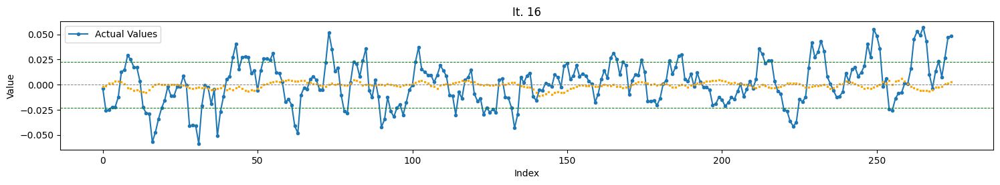

Total TH Pred.: 0
Completed Iteration 16/24

Iteration 17/24
Train : batch    > 256
        epochs   > 300
        n_steps  > 120
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Input shape: (120, 10)
Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_32 (LSTM)              (None, 120, 75)           25800     
                                                                 
 lstm_33 (LSTM)              (None, 25)                10100     
                                                                 
 dense_16 (Dense)            (None, 1)                 26        
          

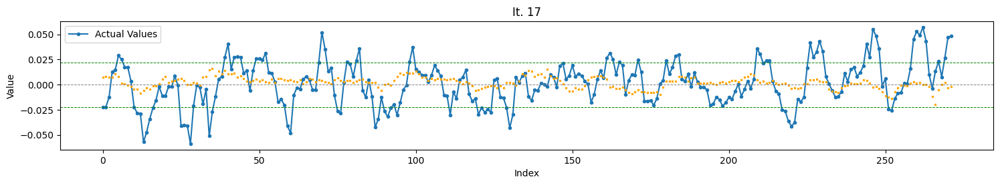

Total TH Pred.: 0
Completed Iteration 17/24

Iteration 18/24
Train : batch    > 128
        epochs   > 300
        n_steps  > 120
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Input shape: (120, 10)
Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_34 (LSTM)              (None, 120, 75)           25800     
                                                                 
 lstm_35 (LSTM)              (None, 25)                10100     
                                                                 
 dense_17 (Dense)            (None, 1)                 26        
          

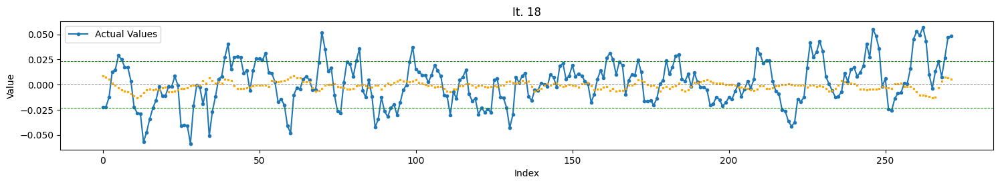

Total TH Pred.: 0
Completed Iteration 18/24

Iteration 19/24
Train : batch    > 256
        epochs   > 300
        n_steps  > 120
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Input shape: (120, 10)
Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_36 (LSTM)              (None, 120, 75)           25800     
                                                                 
 lstm_37 (LSTM)              (None, 25)                10100     
                                                                 
 dense_18 (Dense)            (None, 1)                 26        
             

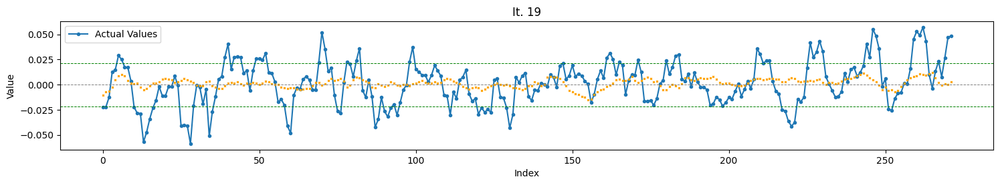

Total TH Pred.: 0
Completed Iteration 19/24

Iteration 20/24
Train : batch    > 128
        epochs   > 300
        n_steps  > 120
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Input shape: (120, 10)
Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_38 (LSTM)              (None, 120, 75)           25800     
                                                                 
 lstm_39 (LSTM)              (None, 25)                10100     
                                                                 
 dense_19 (Dense)            (None, 1)                 26        
             

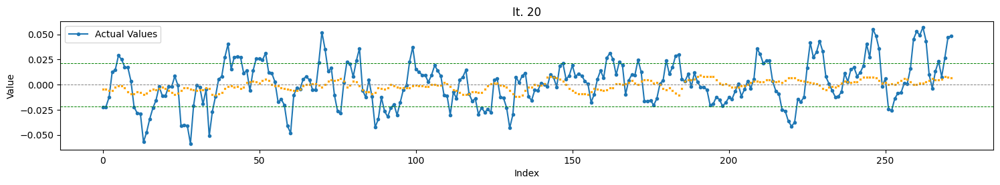

Total TH Pred.: 0
Completed Iteration 20/24

Iteration 21/24
Train : batch    > 256
        epochs   > 300
        n_steps  > 120
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Input shape: (120, 10)
Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_40 (LSTM)              (None, 120, 25)           3600      
                                                                 
 lstm_41 (LSTM)              (None, 25)                5100      
                                                                 
 dense_20 (Dense)            (None, 1)                 26        
          

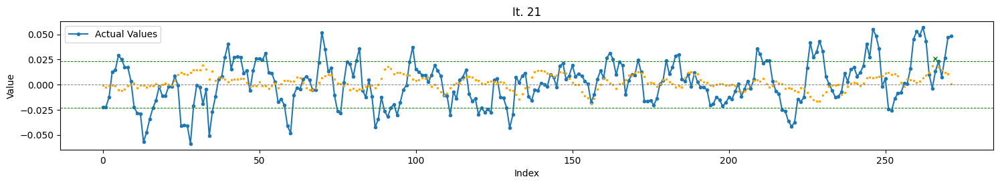

Total TH Pred.: 1
TH Pred. acc. : 100.00
Completed Iteration 21/24

Iteration 22/24
Train : batch    > 128
        epochs   > 300
        n_steps  > 120
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Input shape: (120, 10)
Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_42 (LSTM)              (None, 120, 25)           3600      
                                                                 
 lstm_43 (LSTM)              (None, 25)                5100      
                                                                 
 dense_21 (Dense)            (None, 1)               

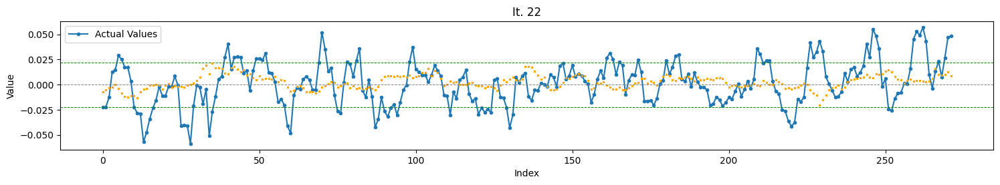

Total TH Pred.: 0
Completed Iteration 22/24

Iteration 23/24
Train : batch    > 256
        epochs   > 300
        n_steps  > 120
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Input shape: (120, 10)
Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_44 (LSTM)              (None, 120, 25)           3600      
                                                                 
 lstm_45 (LSTM)              (None, 25)                5100      
                                                                 
 dense_22 (Dense)            (None, 1)                 26        
             

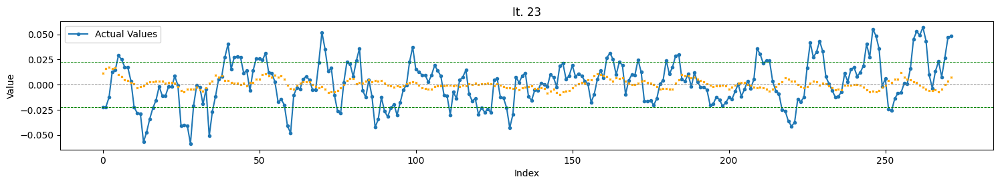

Total TH Pred.: 0
Completed Iteration 23/24

Iteration 24/24
Train : batch    > 128
        epochs   > 300
        n_steps  > 120
Features utilizados: Index(['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D',
       'ACU_3D', 'ACU_2D'],
      dtype='object')
Model params: 
{'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Input shape: (120, 10)
Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_46 (LSTM)              (None, 120, 25)           3600      
                                                                 
 lstm_47 (LSTM)              (None, 25)                5100      
                                                                 
 dense_23 (Dense)            (None, 1)                 26        
             

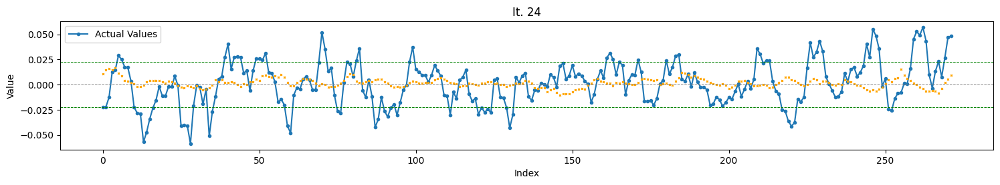

Total TH Pred.: 0
Completed Iteration 24/24


In [15]:
top_results = run_model_iterations()

In [16]:
top_results_sort = sorted(top_results, key=lambda x: x['diff'])[:15]

Top 1 - 0.3
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023227, inv. diff> 0.008990
Trend accuracy       : 60.219
Trend up accuracy    : 72.414
Trend down accuracy  : 46.512


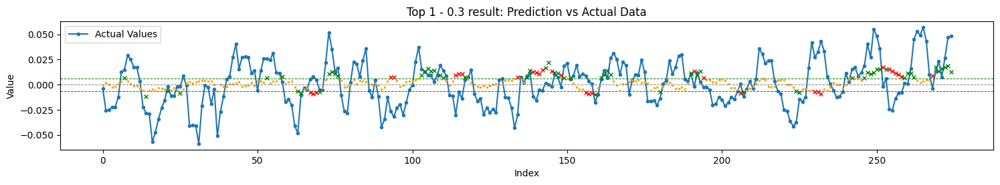

Total TH Pred.: 90
TH Pred. acc. : 65.56


Top 2 - 0.3
n_steps: 40, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023042, inv. diff> 0.009055
Trend accuracy       : 55.273
Trend up accuracy    : 67.123
Trend down accuracy  : 41.860


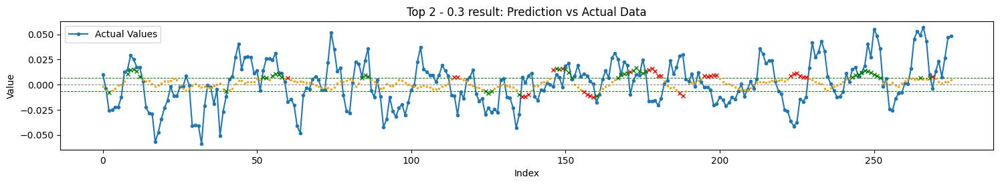

Total TH Pred.: 79
TH Pred. acc. : 59.49


Top 3 - 0.3
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022646, inv. diff> 0.009343
Trend accuracy       : 57.934
Trend up accuracy    : 70.345
Trend down accuracy  : 43.651


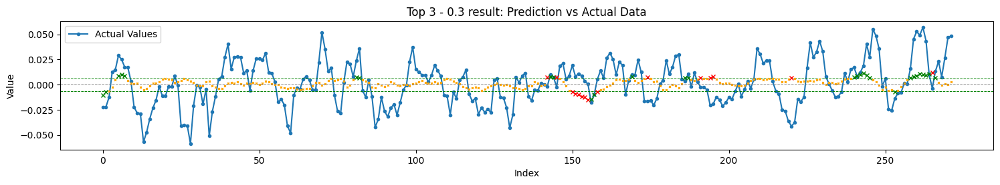

Total TH Pred.: 44
TH Pred. acc. : 65.91


Top 4 - 0.3
n_steps: 120, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022539, inv. diff> 0.009104
Trend accuracy       : 57.565
Trend up accuracy    : 53.103
Trend down accuracy  : 62.698


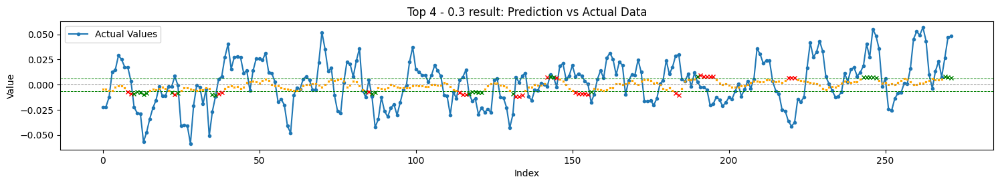

Total TH Pred.: 59
TH Pred. acc. : 50.85


Top 5 - 0.3
n_steps: 60, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022581, inv. diff> 0.009311
Trend accuracy       : 52.190
Trend up accuracy    : 63.448
Trend down accuracy  : 39.535


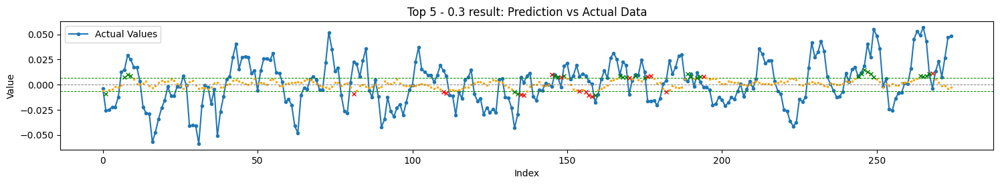

Total TH Pred.: 46
TH Pred. acc. : 63.04


Top 6 - 0.3
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022194, inv. diff> 0.009755
Trend accuracy       : 57.299
Trend up accuracy    : 35.172
Trend down accuracy  : 82.171


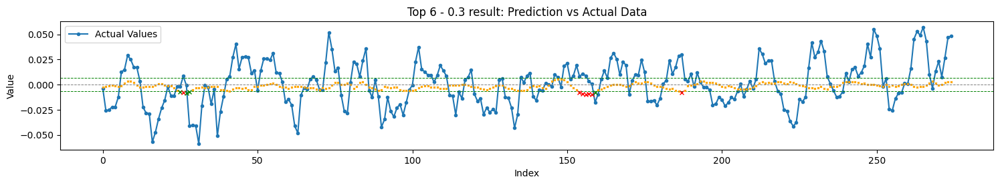

Total TH Pred.: 11
TH Pred. acc. : 36.36


Top 7 - 0.3
n_steps: 120, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023370, inv. diff> 0.008988
Trend accuracy       : 60.517
Trend up accuracy    : 69.655
Trend down accuracy  : 50.000


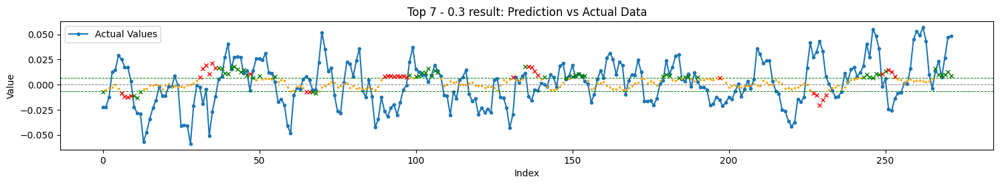

Total TH Pred.: 92
TH Pred. acc. : 60.87


Top 8 - 0.3
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022972, inv. diff> 0.009173
Trend accuracy       : 55.720
Trend up accuracy    : 73.793
Trend down accuracy  : 34.921


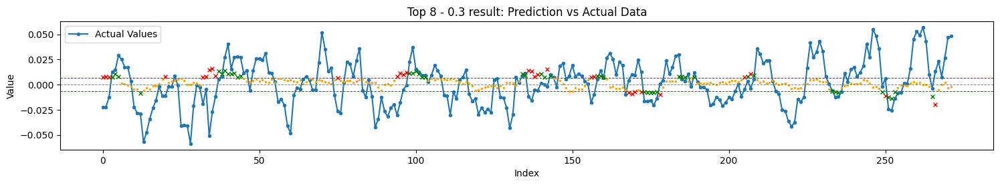

Total TH Pred.: 75
TH Pred. acc. : 60.00


Top 9 - 0.3
n_steps: 40, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023179, inv. diff> 0.009253
Trend accuracy       : 56.727
Trend up accuracy    : 80.137
Trend down accuracy  : 30.233


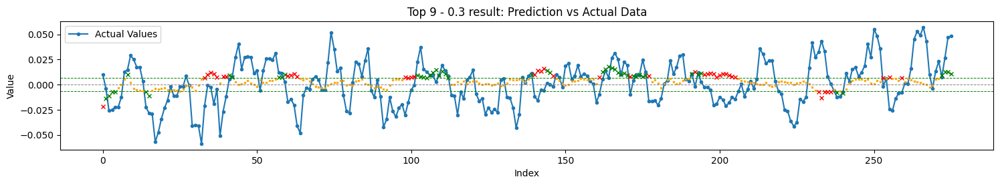

Total TH Pred.: 93
TH Pred. acc. : 52.69


Top 10 - 0.3
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023068, inv. diff> 0.008631
Trend accuracy       : 51.460
Trend up accuracy    : 40.000
Trend down accuracy  : 64.341


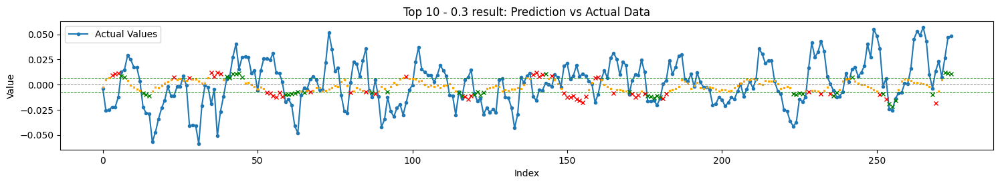

Total TH Pred.: 98
TH Pred. acc. : 47.96


Top 11 - 0.3
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023394, inv. diff> 0.008904
Trend accuracy       : 52.030
Trend up accuracy    : 63.448
Trend down accuracy  : 38.889


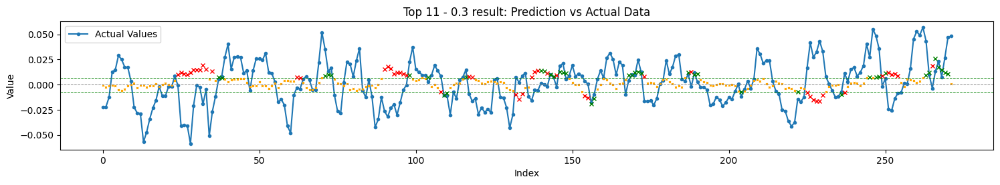

Total TH Pred.: 90
TH Pred. acc. : 45.56


Top 12 - 0.3
n_steps: 60, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022991, inv. diff> 0.009421
Trend accuracy       : 47.810
Trend up accuracy    : 74.483
Trend down accuracy  : 17.829


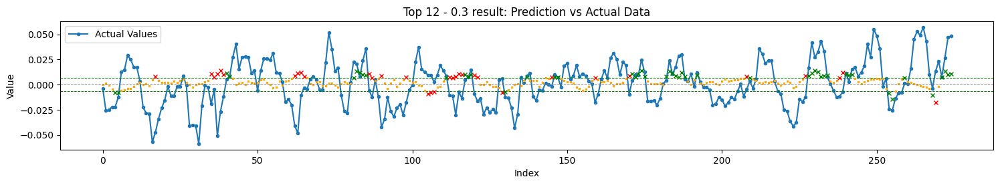

Total TH Pred.: 82
TH Pred. acc. : 59.76


Top 13 - 0.3
n_steps: 40, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023994, inv. diff> 0.009694
Trend accuracy       : 55.636
Trend up accuracy    : 86.986
Trend down accuracy  : 20.155


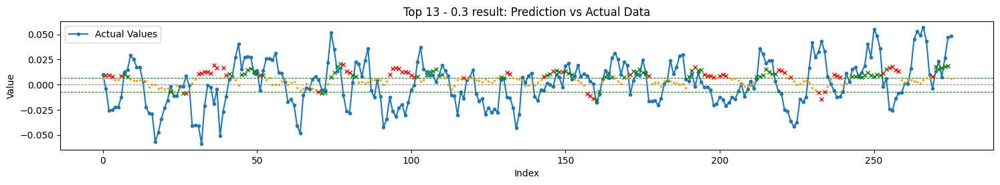

Total TH Pred.: 136
TH Pred. acc. : 53.68


Top 14 - 0.3
n_steps: 40, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022545, inv. diff> 0.009047
Trend accuracy       : 51.273
Trend up accuracy    : 52.055
Trend down accuracy  : 50.388


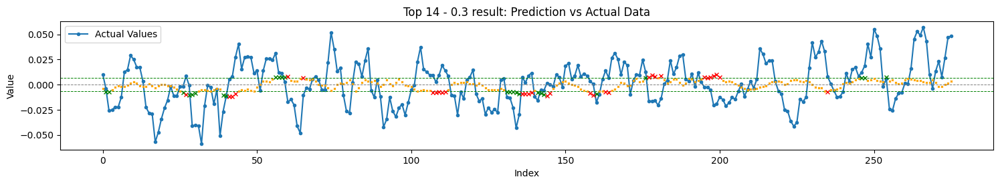

Total TH Pred.: 57
TH Pred. acc. : 43.86


Top 15 - 0.3
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022610, inv. diff> 0.009219
Trend accuracy       : 51.661
Trend up accuracy    : 53.103
Trend down accuracy  : 50.000


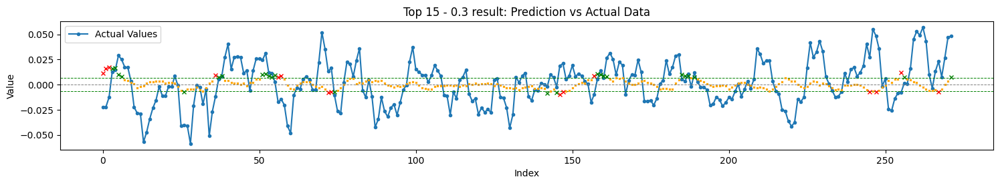

Total TH Pred.: 40
TH Pred. acc. : 62.50


Top 1 - 0.4
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023227, inv. diff> 0.008990
Trend accuracy       : 60.219
Trend up accuracy    : 72.414
Trend down accuracy  : 46.512


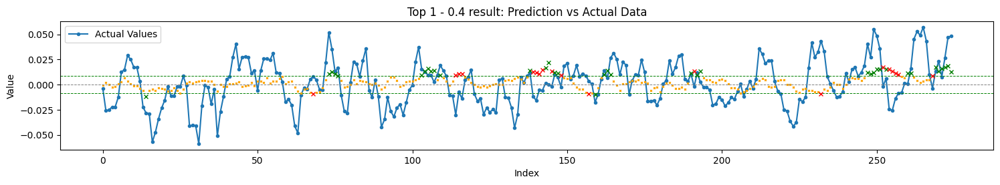

Total TH Pred.: 56
TH Pred. acc. : 66.07


Top 2 - 0.4
n_steps: 40, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023042, inv. diff> 0.009055
Trend accuracy       : 55.273
Trend up accuracy    : 67.123
Trend down accuracy  : 41.860


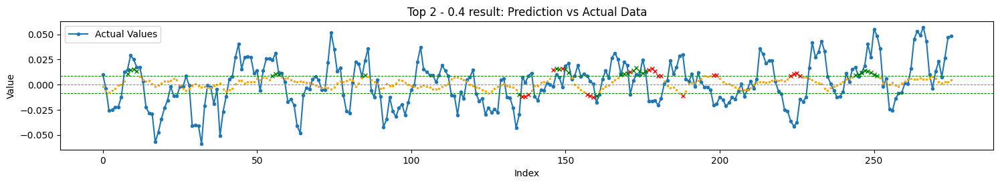

Total TH Pred.: 51
TH Pred. acc. : 58.82


Top 3 - 0.4
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022646, inv. diff> 0.009343
Trend accuracy       : 57.934
Trend up accuracy    : 70.345
Trend down accuracy  : 43.651


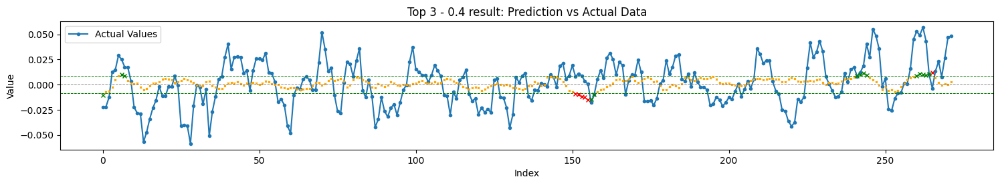

Total TH Pred.: 20
TH Pred. acc. : 70.00


Top 4 - 0.4
n_steps: 120, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022539, inv. diff> 0.009104
Trend accuracy       : 57.565
Trend up accuracy    : 53.103
Trend down accuracy  : 62.698


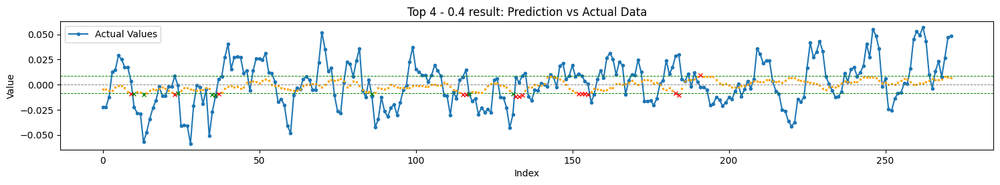

Total TH Pred.: 23
TH Pred. acc. : 34.78


Top 5 - 0.4
n_steps: 60, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022581, inv. diff> 0.009311
Trend accuracy       : 52.190
Trend up accuracy    : 63.448
Trend down accuracy  : 39.535


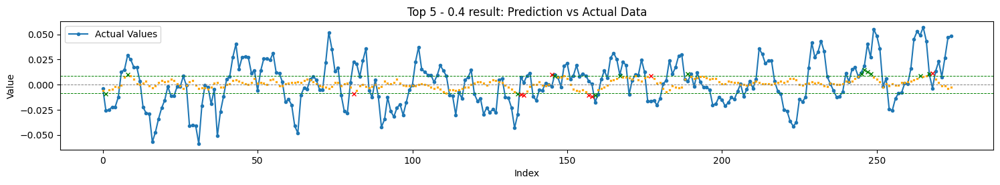

Total TH Pred.: 21
TH Pred. acc. : 61.90


Top 6 - 0.4
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022194, inv. diff> 0.009755
Trend accuracy       : 57.299
Trend up accuracy    : 35.172
Trend down accuracy  : 82.171


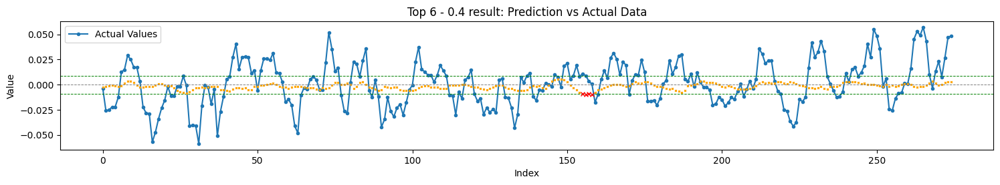

Total TH Pred.: 4
TH Pred. acc. : 0.00


Top 7 - 0.4
n_steps: 120, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023370, inv. diff> 0.008988
Trend accuracy       : 60.517
Trend up accuracy    : 69.655
Trend down accuracy  : 50.000


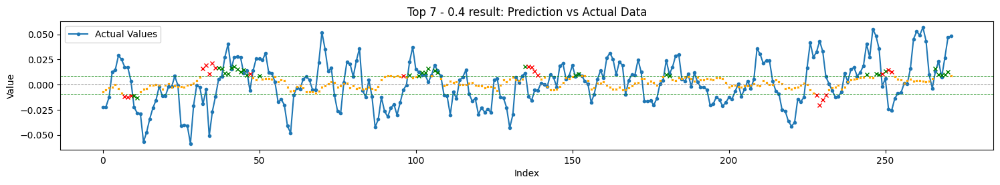

Total TH Pred.: 55
TH Pred. acc. : 61.82


Top 8 - 0.4
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022972, inv. diff> 0.009173
Trend accuracy       : 55.720
Trend up accuracy    : 73.793
Trend down accuracy  : 34.921


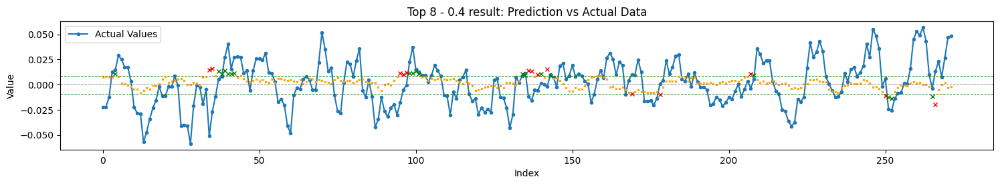

Total TH Pred.: 33
TH Pred. acc. : 57.58


Top 9 - 0.4
n_steps: 40, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023179, inv. diff> 0.009253
Trend accuracy       : 56.727
Trend up accuracy    : 80.137
Trend down accuracy  : 30.233


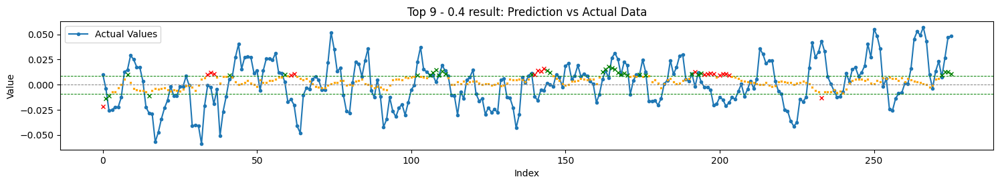

Total TH Pred.: 54
TH Pred. acc. : 62.96


Top 10 - 0.4
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023068, inv. diff> 0.008631
Trend accuracy       : 51.460
Trend up accuracy    : 40.000
Trend down accuracy  : 64.341


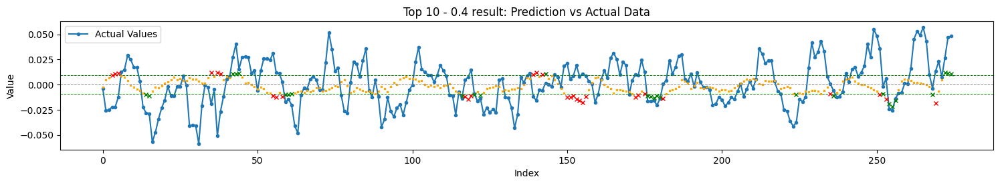

Total TH Pred.: 57
TH Pred. acc. : 47.37


Top 11 - 0.4
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023394, inv. diff> 0.008904
Trend accuracy       : 52.030
Trend up accuracy    : 63.448
Trend down accuracy  : 38.889


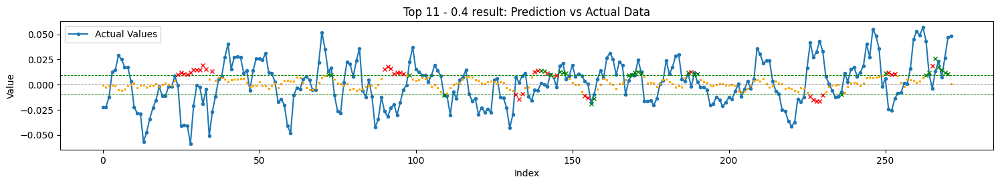

Total TH Pred.: 66
TH Pred. acc. : 43.94


Top 12 - 0.4
n_steps: 60, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022991, inv. diff> 0.009421
Trend accuracy       : 47.810
Trend up accuracy    : 74.483
Trend down accuracy  : 17.829


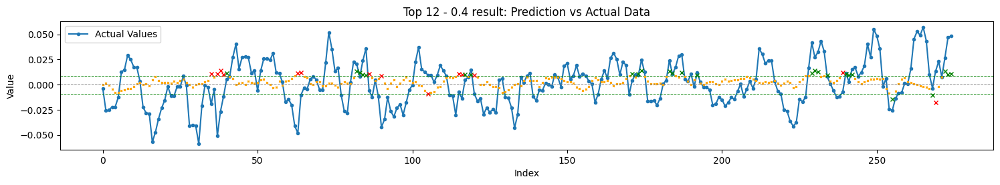

Total TH Pred.: 40
TH Pred. acc. : 65.00


Top 13 - 0.4
n_steps: 40, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023994, inv. diff> 0.009694
Trend accuracy       : 55.636
Trend up accuracy    : 86.986
Trend down accuracy  : 20.155


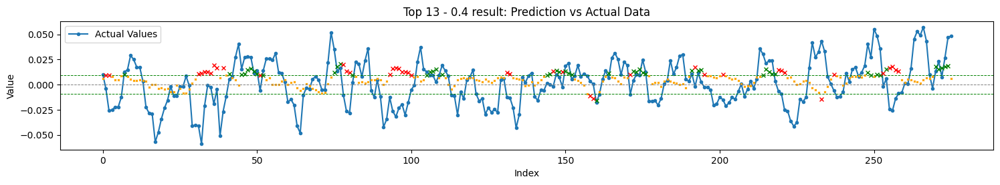

Total TH Pred.: 92
TH Pred. acc. : 54.35


Top 14 - 0.4
n_steps: 40, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022545, inv. diff> 0.009047
Trend accuracy       : 51.273
Trend up accuracy    : 52.055
Trend down accuracy  : 50.388


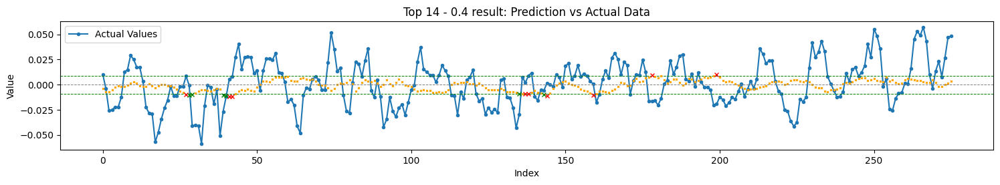

Total TH Pred.: 15
TH Pred. acc. : 40.00


Top 15 - 0.4
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022610, inv. diff> 0.009219
Trend accuracy       : 51.661
Trend up accuracy    : 53.103
Trend down accuracy  : 50.000


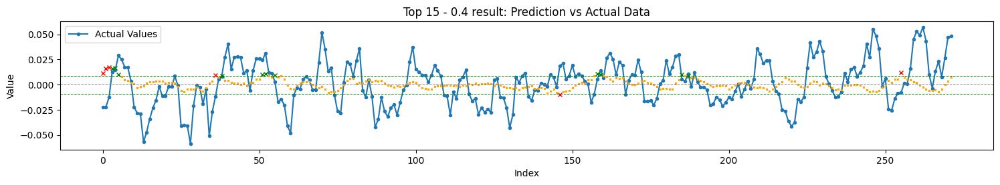

Total TH Pred.: 17
TH Pred. acc. : 64.71


Top 1 - 0.5
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023227, inv. diff> 0.008990
Trend accuracy       : 60.219
Trend up accuracy    : 72.414
Trend down accuracy  : 46.512


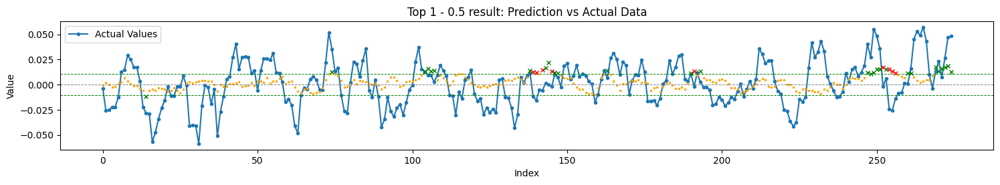

Total TH Pred.: 37
TH Pred. acc. : 75.68


Top 2 - 0.5
n_steps: 40, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023042, inv. diff> 0.009055
Trend accuracy       : 55.273
Trend up accuracy    : 67.123
Trend down accuracy  : 41.860


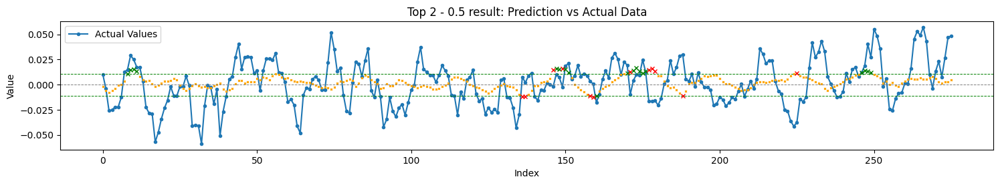

Total TH Pred.: 31
TH Pred. acc. : 61.29


Top 3 - 0.5
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022646, inv. diff> 0.009343
Trend accuracy       : 57.934
Trend up accuracy    : 70.345
Trend down accuracy  : 43.651


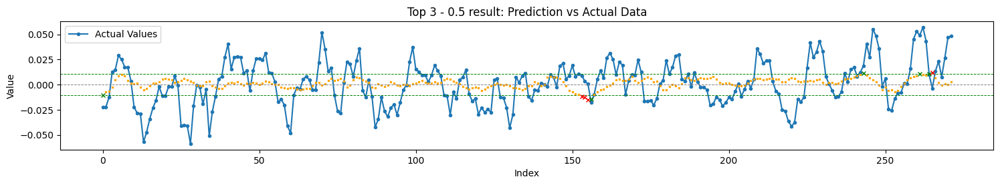

Total TH Pred.: 9
TH Pred. acc. : 55.56


Top 4 - 0.5
n_steps: 120, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022539, inv. diff> 0.009104
Trend accuracy       : 57.565
Trend up accuracy    : 53.103
Trend down accuracy  : 62.698


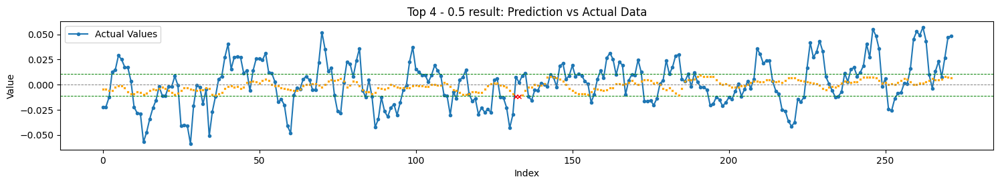

Total TH Pred.: 2
TH Pred. acc. : 0.00


Top 5 - 0.5
n_steps: 60, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022581, inv. diff> 0.009311
Trend accuracy       : 52.190
Trend up accuracy    : 63.448
Trend down accuracy  : 39.535


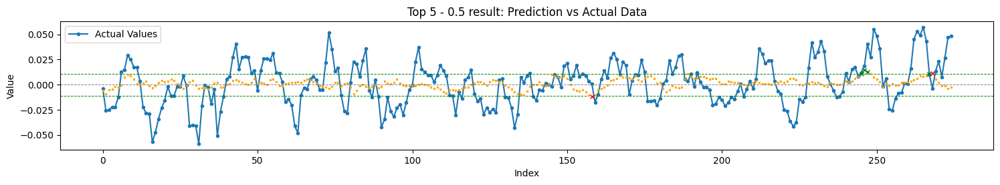

Total TH Pred.: 6
TH Pred. acc. : 66.67


Top 6 - 0.5
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022194, inv. diff> 0.009755
Trend accuracy       : 57.299
Trend up accuracy    : 35.172
Trend down accuracy  : 82.171


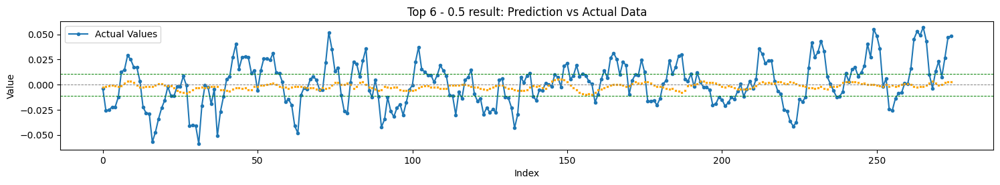

Total TH Pred.: 0


Top 7 - 0.5
n_steps: 120, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023370, inv. diff> 0.008988
Trend accuracy       : 60.517
Trend up accuracy    : 69.655
Trend down accuracy  : 50.000


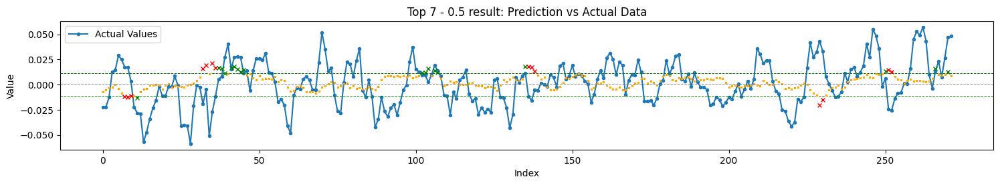

Total TH Pred.: 32
TH Pred. acc. : 56.25


Top 8 - 0.5
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022972, inv. diff> 0.009173
Trend accuracy       : 55.720
Trend up accuracy    : 73.793
Trend down accuracy  : 34.921


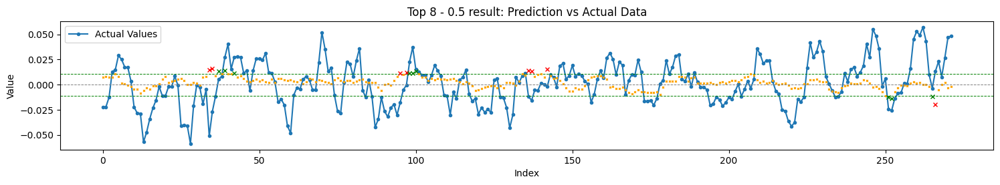

Total TH Pred.: 17
TH Pred. acc. : 52.94


Top 9 - 0.5
n_steps: 40, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023179, inv. diff> 0.009253
Trend accuracy       : 56.727
Trend up accuracy    : 80.137
Trend down accuracy  : 30.233


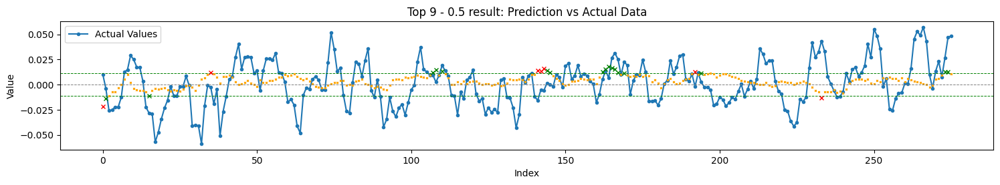

Total TH Pred.: 24
TH Pred. acc. : 70.83


Top 10 - 0.5
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023068, inv. diff> 0.008631
Trend accuracy       : 51.460
Trend up accuracy    : 40.000
Trend down accuracy  : 64.341


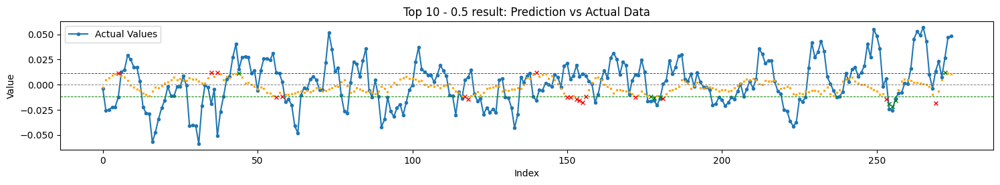

Total TH Pred.: 26
TH Pred. acc. : 30.77


Top 11 - 0.5
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023394, inv. diff> 0.008904
Trend accuracy       : 52.030
Trend up accuracy    : 63.448
Trend down accuracy  : 38.889


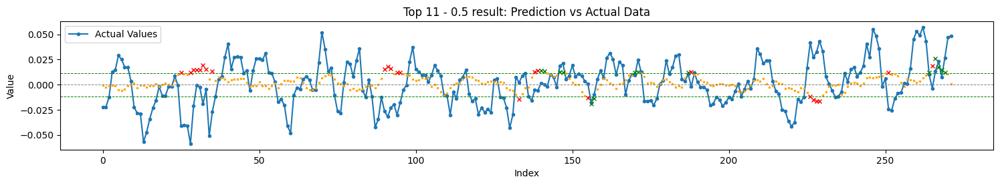

Total TH Pred.: 38
TH Pred. acc. : 36.84


Top 12 - 0.5
n_steps: 60, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022991, inv. diff> 0.009421
Trend accuracy       : 47.810
Trend up accuracy    : 74.483
Trend down accuracy  : 17.829


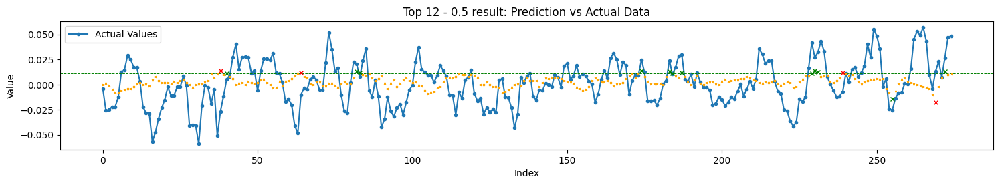

Total TH Pred.: 16
TH Pred. acc. : 75.00


Top 13 - 0.5
n_steps: 40, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023994, inv. diff> 0.009694
Trend accuracy       : 55.636
Trend up accuracy    : 86.986
Trend down accuracy  : 20.155


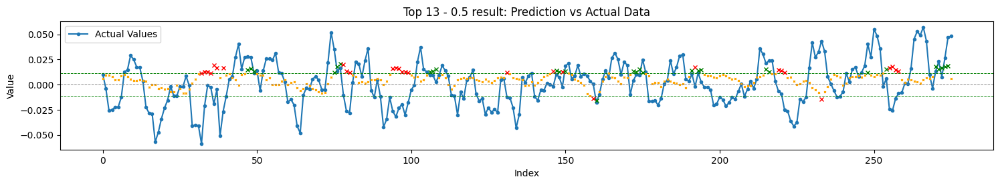

Total TH Pred.: 58
TH Pred. acc. : 50.00


Top 14 - 0.5
n_steps: 40, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022545, inv. diff> 0.009047
Trend accuracy       : 51.273
Trend up accuracy    : 52.055
Trend down accuracy  : 50.388


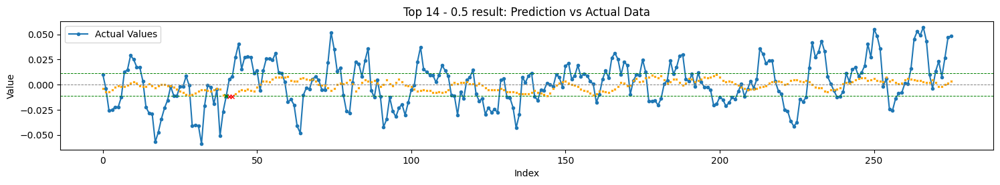

Total TH Pred.: 3
TH Pred. acc. : 33.33


Top 15 - 0.5
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022610, inv. diff> 0.009219
Trend accuracy       : 51.661
Trend up accuracy    : 53.103
Trend down accuracy  : 50.000


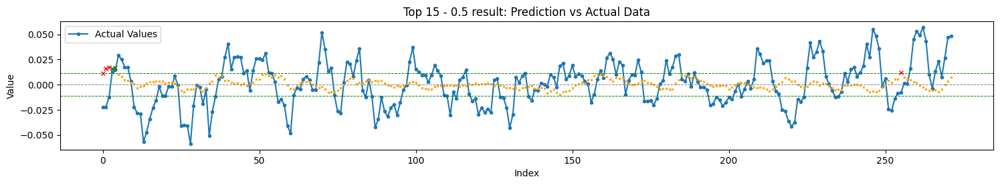

Total TH Pred.: 6
TH Pred. acc. : 33.33


Top 1 - 0.6
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023227, inv. diff> 0.008990
Trend accuracy       : 60.219
Trend up accuracy    : 72.414
Trend down accuracy  : 46.512


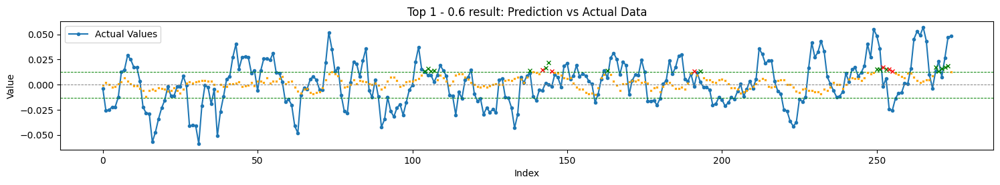

Total TH Pred.: 23
TH Pred. acc. : 73.91


Top 2 - 0.6
n_steps: 40, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023042, inv. diff> 0.009055
Trend accuracy       : 55.273
Trend up accuracy    : 67.123
Trend down accuracy  : 41.860


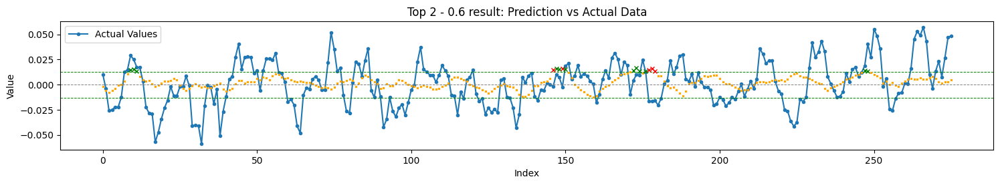

Total TH Pred.: 17
TH Pred. acc. : 70.59


Top 3 - 0.6
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022646, inv. diff> 0.009343
Trend accuracy       : 57.934
Trend up accuracy    : 70.345
Trend down accuracy  : 43.651


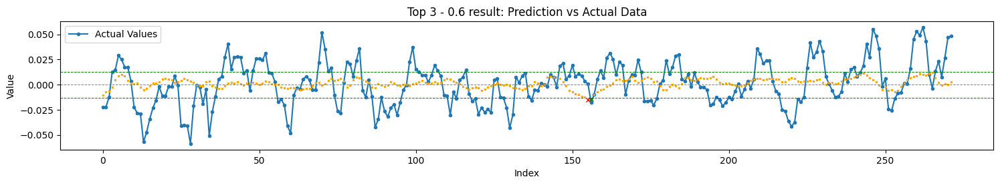

Total TH Pred.: 2
TH Pred. acc. : 50.00


Top 4 - 0.6
n_steps: 120, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022539, inv. diff> 0.009104
Trend accuracy       : 57.565
Trend up accuracy    : 53.103
Trend down accuracy  : 62.698


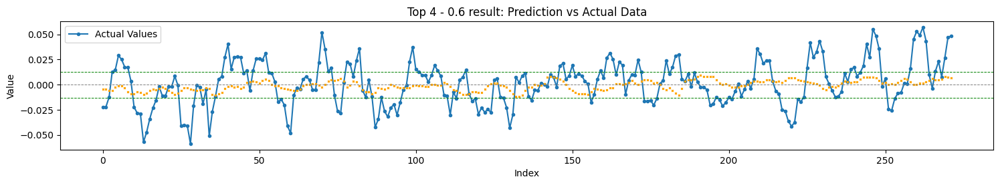

Total TH Pred.: 0


Top 5 - 0.6
n_steps: 60, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022581, inv. diff> 0.009311
Trend accuracy       : 52.190
Trend up accuracy    : 63.448
Trend down accuracy  : 39.535


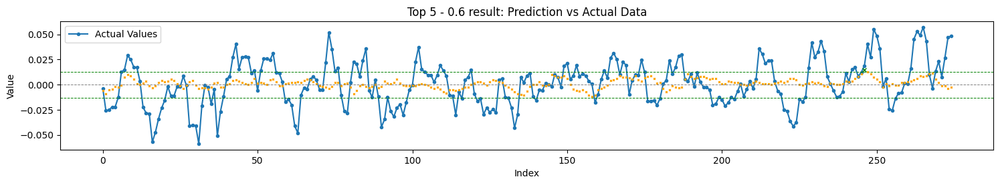

Total TH Pred.: 1
TH Pred. acc. : 100.00


Top 6 - 0.6
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022194, inv. diff> 0.009755
Trend accuracy       : 57.299
Trend up accuracy    : 35.172
Trend down accuracy  : 82.171


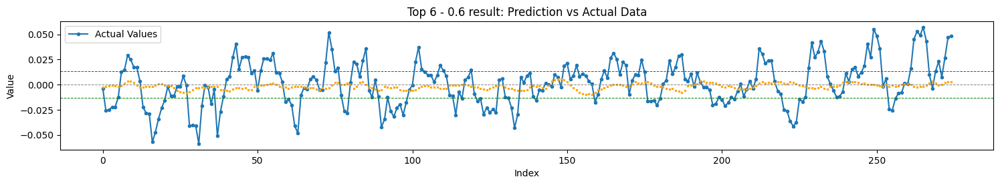

Total TH Pred.: 0


Top 7 - 0.6
n_steps: 120, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023370, inv. diff> 0.008988
Trend accuracy       : 60.517
Trend up accuracy    : 69.655
Trend down accuracy  : 50.000


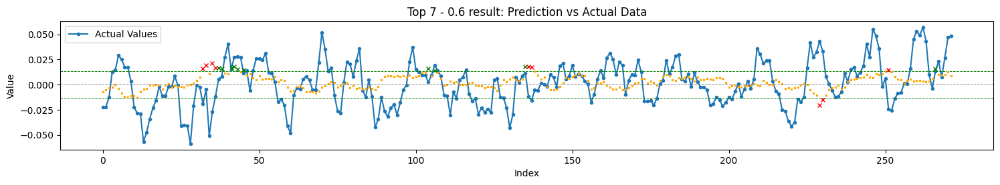

Total TH Pred.: 19
TH Pred. acc. : 52.63


Top 8 - 0.6
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022972, inv. diff> 0.009173
Trend accuracy       : 55.720
Trend up accuracy    : 73.793
Trend down accuracy  : 34.921


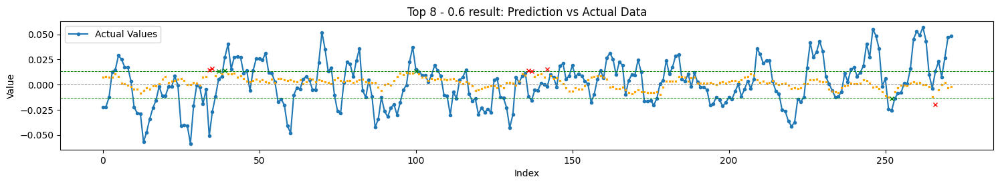

Total TH Pred.: 10
TH Pred. acc. : 40.00


Top 9 - 0.6
n_steps: 40, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023179, inv. diff> 0.009253
Trend accuracy       : 56.727
Trend up accuracy    : 80.137
Trend down accuracy  : 30.233


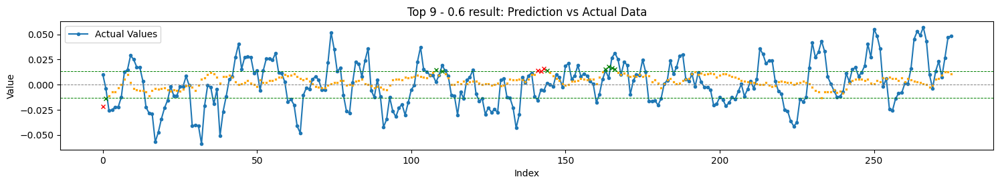

Total TH Pred.: 12
TH Pred. acc. : 66.67


Top 10 - 0.6
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023068, inv. diff> 0.008631
Trend accuracy       : 51.460
Trend up accuracy    : 40.000
Trend down accuracy  : 64.341


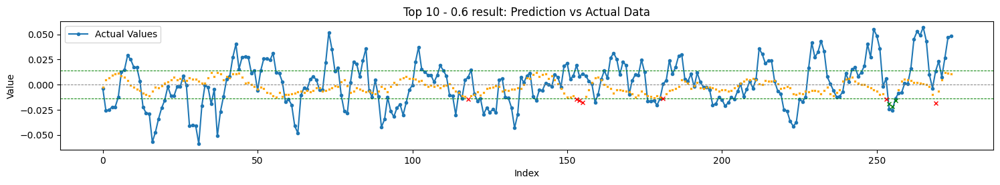

Total TH Pred.: 10
TH Pred. acc. : 30.00


Top 11 - 0.6
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023394, inv. diff> 0.008904
Trend accuracy       : 52.030
Trend up accuracy    : 63.448
Trend down accuracy  : 38.889


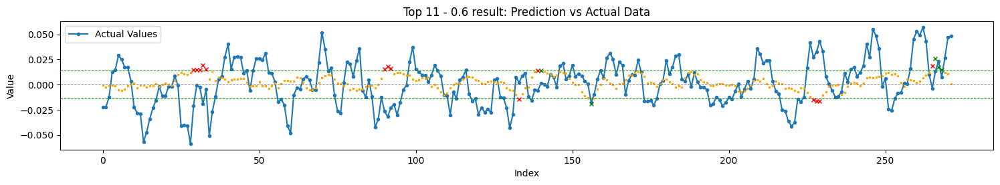

Total TH Pred.: 19
TH Pred. acc. : 26.32


Top 12 - 0.6
n_steps: 60, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022991, inv. diff> 0.009421
Trend accuracy       : 47.810
Trend up accuracy    : 74.483
Trend down accuracy  : 17.829


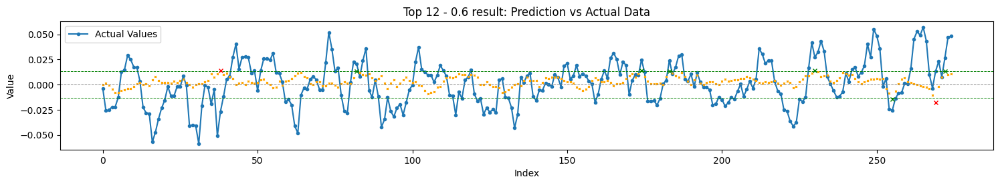

Total TH Pred.: 8
TH Pred. acc. : 75.00


Top 13 - 0.6
n_steps: 40, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023994, inv. diff> 0.009694
Trend accuracy       : 55.636
Trend up accuracy    : 86.986
Trend down accuracy  : 20.155


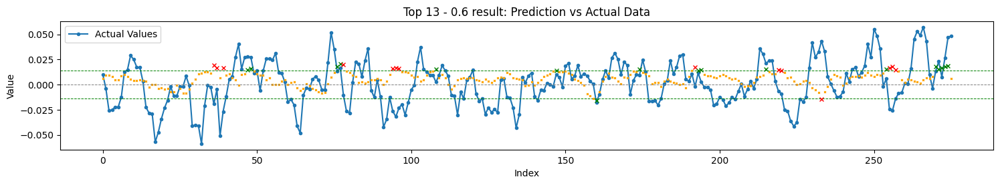

Total TH Pred.: 31
TH Pred. acc. : 54.84


Top 14 - 0.6
n_steps: 40, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022545, inv. diff> 0.009047
Trend accuracy       : 51.273
Trend up accuracy    : 52.055
Trend down accuracy  : 50.388


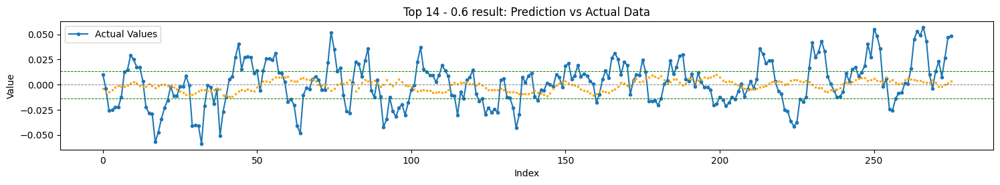

Total TH Pred.: 0


Top 15 - 0.6
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022610, inv. diff> 0.009219
Trend accuracy       : 51.661
Trend up accuracy    : 53.103
Trend down accuracy  : 50.000


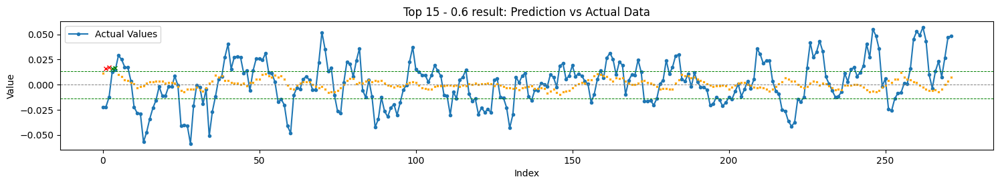

Total TH Pred.: 4
TH Pred. acc. : 50.00


Top 1 - 0.7
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023227, inv. diff> 0.008990
Trend accuracy       : 60.219
Trend up accuracy    : 72.414
Trend down accuracy  : 46.512


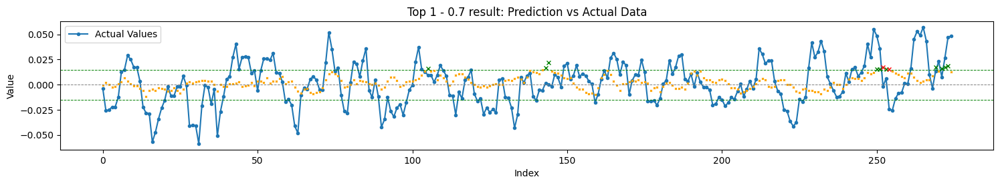

Total TH Pred.: 12
TH Pred. acc. : 83.33


Top 2 - 0.7
n_steps: 40, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023042, inv. diff> 0.009055
Trend accuracy       : 55.273
Trend up accuracy    : 67.123
Trend down accuracy  : 41.860


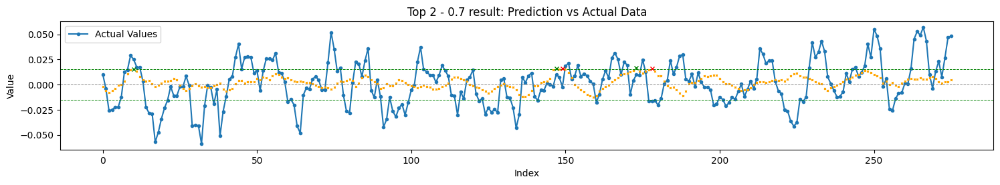

Total TH Pred.: 5
TH Pred. acc. : 60.00


Top 3 - 0.7
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022646, inv. diff> 0.009343
Trend accuracy       : 57.934
Trend up accuracy    : 70.345
Trend down accuracy  : 43.651


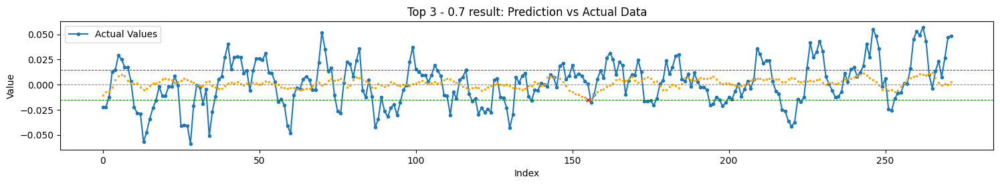

Total TH Pred.: 1
TH Pred. acc. : 0.00


Top 4 - 0.7
n_steps: 120, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022539, inv. diff> 0.009104
Trend accuracy       : 57.565
Trend up accuracy    : 53.103
Trend down accuracy  : 62.698


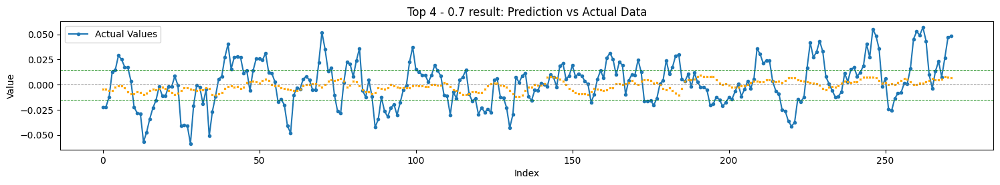

Total TH Pred.: 0


Top 5 - 0.7
n_steps: 60, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022581, inv. diff> 0.009311
Trend accuracy       : 52.190
Trend up accuracy    : 63.448
Trend down accuracy  : 39.535


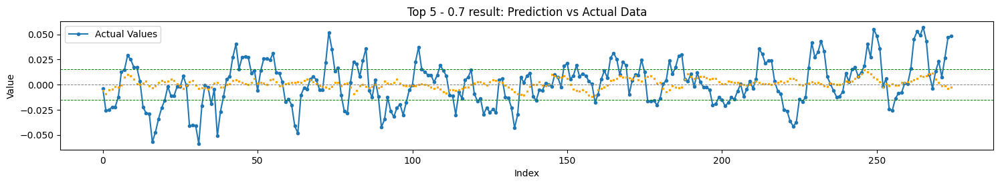

Total TH Pred.: 0


Top 6 - 0.7
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022194, inv. diff> 0.009755
Trend accuracy       : 57.299
Trend up accuracy    : 35.172
Trend down accuracy  : 82.171


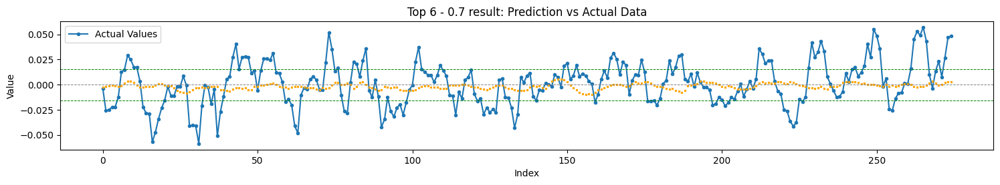

Total TH Pred.: 0


Top 7 - 0.7
n_steps: 120, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023370, inv. diff> 0.008988
Trend accuracy       : 60.517
Trend up accuracy    : 69.655
Trend down accuracy  : 50.000


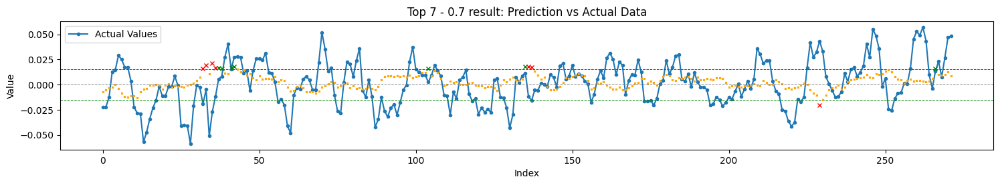

Total TH Pred.: 14
TH Pred. acc. : 50.00


Top 8 - 0.7
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022972, inv. diff> 0.009173
Trend accuracy       : 55.720
Trend up accuracy    : 73.793
Trend down accuracy  : 34.921


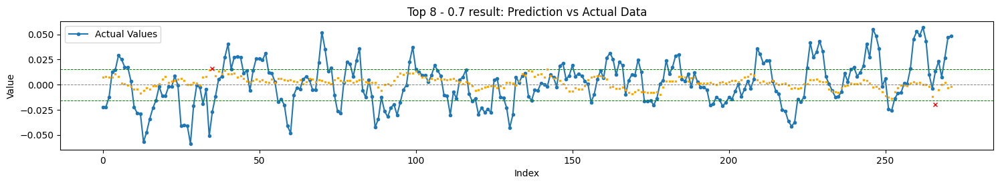

Total TH Pred.: 2
TH Pred. acc. : 0.00


Top 9 - 0.7
n_steps: 40, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023179, inv. diff> 0.009253
Trend accuracy       : 56.727
Trend up accuracy    : 80.137
Trend down accuracy  : 30.233


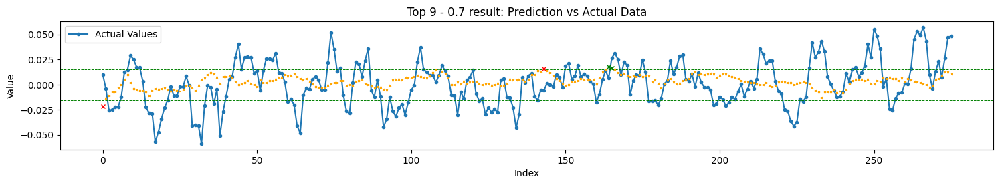

Total TH Pred.: 4
TH Pred. acc. : 50.00


Top 10 - 0.7
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023068, inv. diff> 0.008631
Trend accuracy       : 51.460
Trend up accuracy    : 40.000
Trend down accuracy  : 64.341


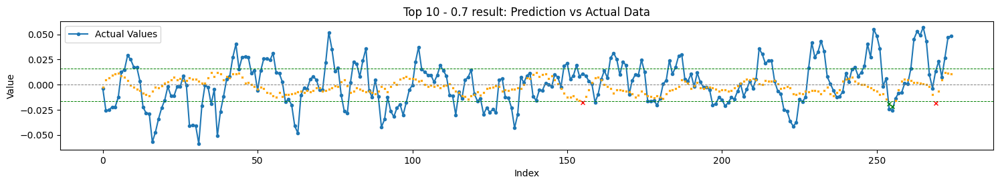

Total TH Pred.: 4
TH Pred. acc. : 50.00


Top 11 - 0.7
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023394, inv. diff> 0.008904
Trend accuracy       : 52.030
Trend up accuracy    : 63.448
Trend down accuracy  : 38.889


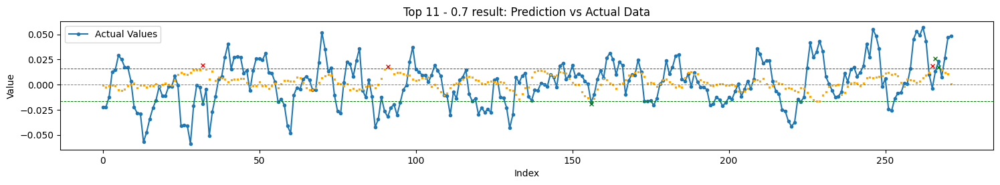

Total TH Pred.: 6
TH Pred. acc. : 50.00


Top 12 - 0.7
n_steps: 60, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022991, inv. diff> 0.009421
Trend accuracy       : 47.810
Trend up accuracy    : 74.483
Trend down accuracy  : 17.829


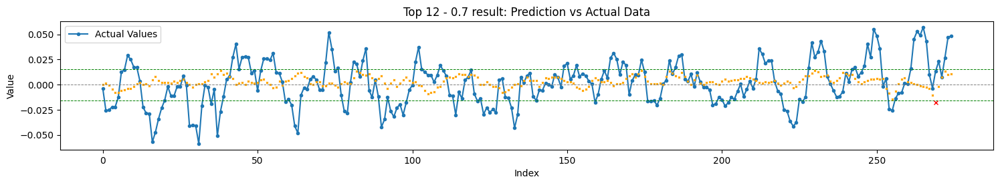

Total TH Pred.: 1
TH Pred. acc. : 0.00


Top 13 - 0.7
n_steps: 40, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023994, inv. diff> 0.009694
Trend accuracy       : 55.636
Trend up accuracy    : 86.986
Trend down accuracy  : 20.155


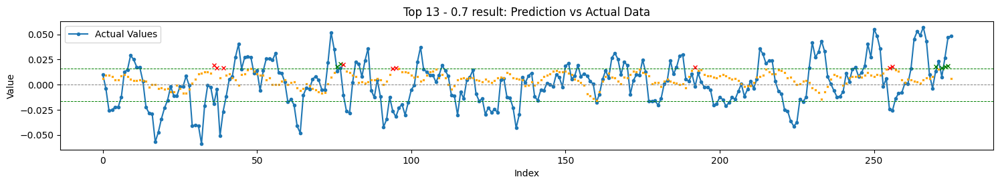

Total TH Pred.: 15
TH Pred. acc. : 40.00


Top 14 - 0.7
n_steps: 40, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022545, inv. diff> 0.009047
Trend accuracy       : 51.273
Trend up accuracy    : 52.055
Trend down accuracy  : 50.388


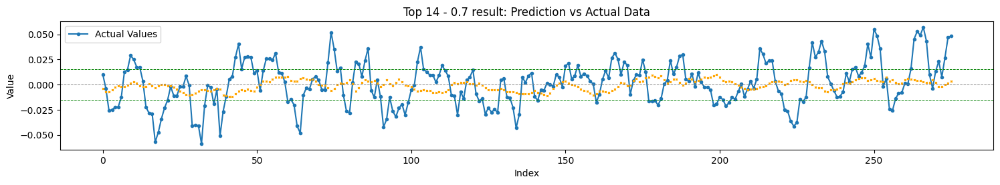

Total TH Pred.: 0


Top 15 - 0.7
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022610, inv. diff> 0.009219
Trend accuracy       : 51.661
Trend up accuracy    : 53.103
Trend down accuracy  : 50.000


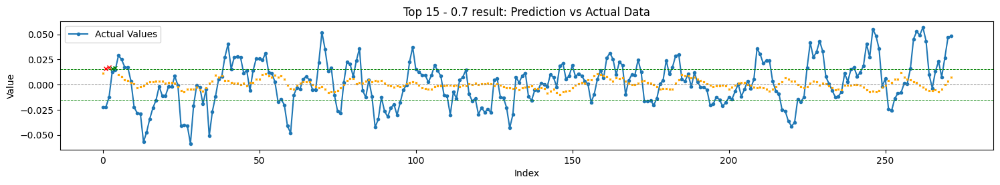

Total TH Pred.: 4
TH Pred. acc. : 50.00


Top 1 - 0.8
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023227, inv. diff> 0.008990
Trend accuracy       : 60.219
Trend up accuracy    : 72.414
Trend down accuracy  : 46.512


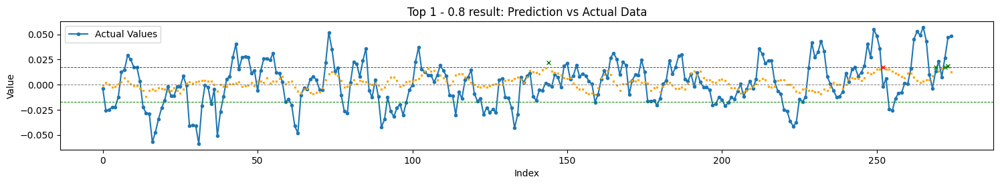

Total TH Pred.: 5
TH Pred. acc. : 80.00


Top 2 - 0.8
n_steps: 40, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023042, inv. diff> 0.009055
Trend accuracy       : 55.273
Trend up accuracy    : 67.123
Trend down accuracy  : 41.860


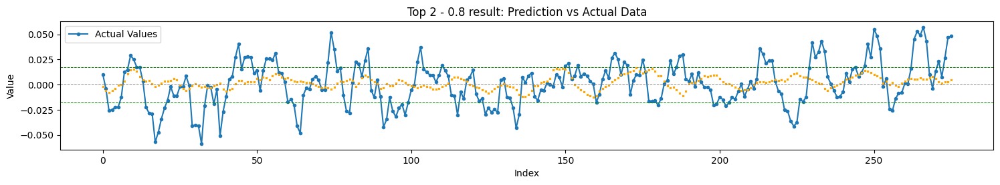

Total TH Pred.: 0


Top 3 - 0.8
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022646, inv. diff> 0.009343
Trend accuracy       : 57.934
Trend up accuracy    : 70.345
Trend down accuracy  : 43.651


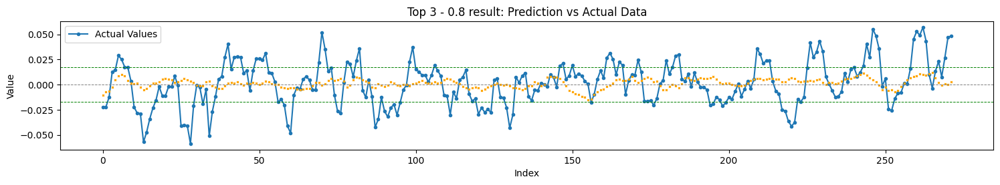

Total TH Pred.: 0


Top 4 - 0.8
n_steps: 120, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022539, inv. diff> 0.009104
Trend accuracy       : 57.565
Trend up accuracy    : 53.103
Trend down accuracy  : 62.698


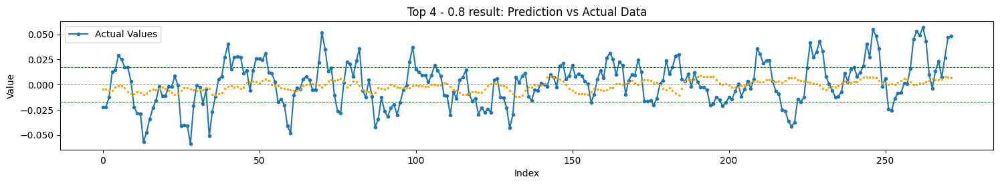

Total TH Pred.: 0


Top 5 - 0.8
n_steps: 60, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022581, inv. diff> 0.009311
Trend accuracy       : 52.190
Trend up accuracy    : 63.448
Trend down accuracy  : 39.535


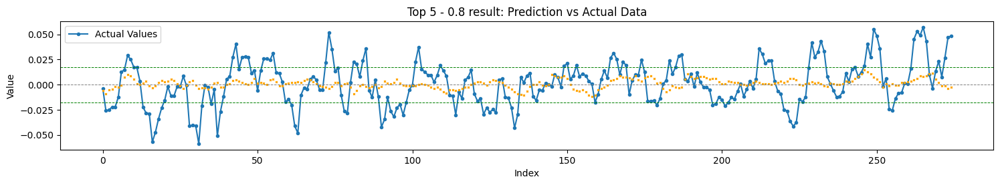

Total TH Pred.: 0


Top 6 - 0.8
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022194, inv. diff> 0.009755
Trend accuracy       : 57.299
Trend up accuracy    : 35.172
Trend down accuracy  : 82.171


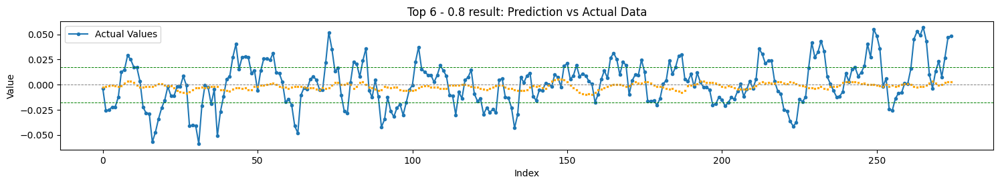

Total TH Pred.: 0


Top 7 - 0.8
n_steps: 120, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023370, inv. diff> 0.008988
Trend accuracy       : 60.517
Trend up accuracy    : 69.655
Trend down accuracy  : 50.000


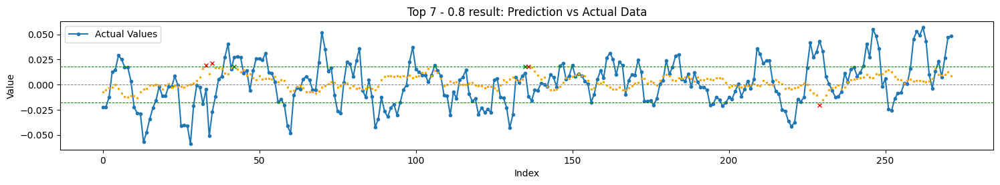

Total TH Pred.: 6
TH Pred. acc. : 33.33


Top 8 - 0.8
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022972, inv. diff> 0.009173
Trend accuracy       : 55.720
Trend up accuracy    : 73.793
Trend down accuracy  : 34.921


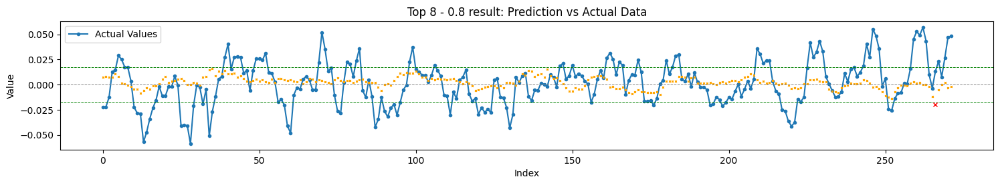

Total TH Pred.: 1
TH Pred. acc. : 0.00


Top 9 - 0.8
n_steps: 40, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023179, inv. diff> 0.009253
Trend accuracy       : 56.727
Trend up accuracy    : 80.137
Trend down accuracy  : 30.233


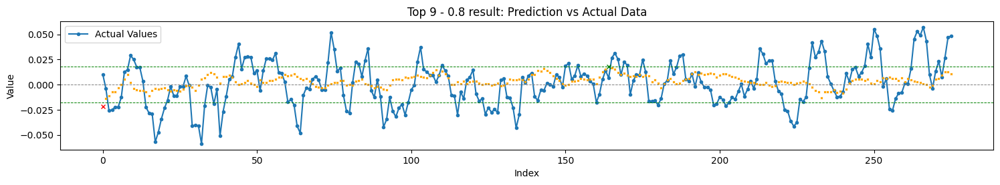

Total TH Pred.: 2
TH Pred. acc. : 50.00


Top 10 - 0.8
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023068, inv. diff> 0.008631
Trend accuracy       : 51.460
Trend up accuracy    : 40.000
Trend down accuracy  : 64.341


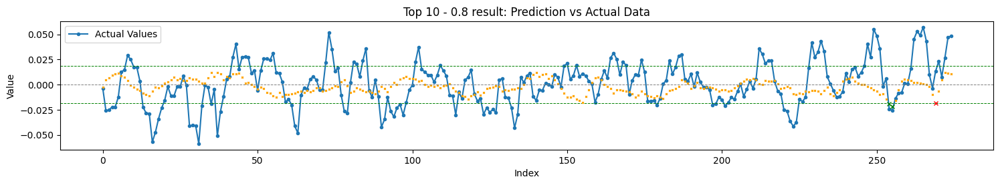

Total TH Pred.: 3
TH Pred. acc. : 66.67


Top 11 - 0.8
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023394, inv. diff> 0.008904
Trend accuracy       : 52.030
Trend up accuracy    : 63.448
Trend down accuracy  : 38.889


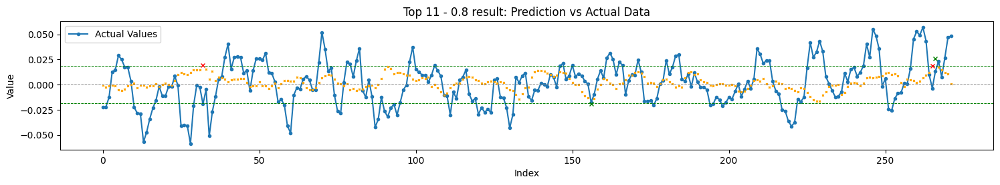

Total TH Pred.: 4
TH Pred. acc. : 50.00


Top 12 - 0.8
n_steps: 60, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022991, inv. diff> 0.009421
Trend accuracy       : 47.810
Trend up accuracy    : 74.483
Trend down accuracy  : 17.829


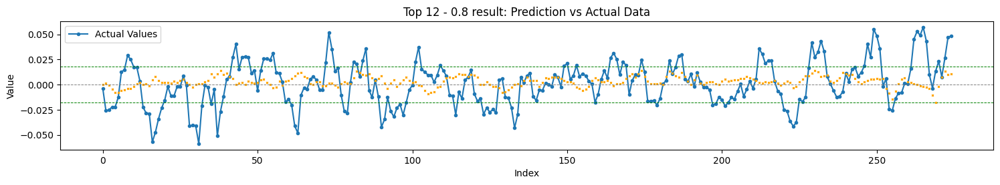

Total TH Pred.: 0


Top 13 - 0.8
n_steps: 40, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023994, inv. diff> 0.009694
Trend accuracy       : 55.636
Trend up accuracy    : 86.986
Trend down accuracy  : 20.155


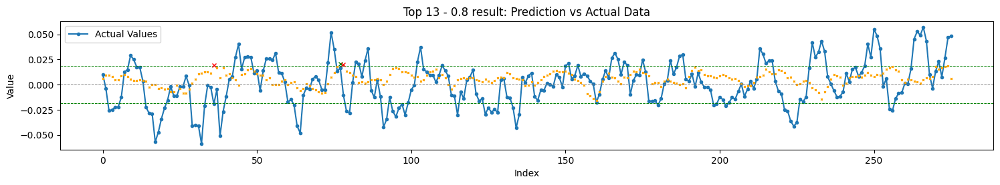

Total TH Pred.: 3
TH Pred. acc. : 33.33


Top 14 - 0.8
n_steps: 40, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022545, inv. diff> 0.009047
Trend accuracy       : 51.273
Trend up accuracy    : 52.055
Trend down accuracy  : 50.388


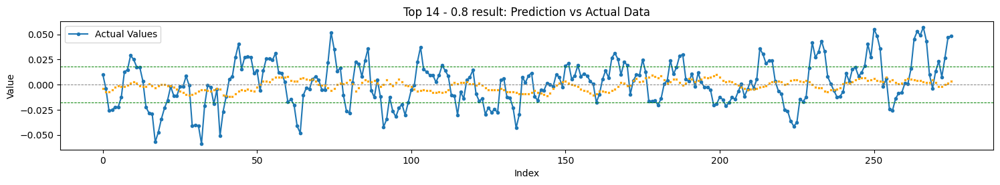

Total TH Pred.: 0


Top 15 - 0.8
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022610, inv. diff> 0.009219
Trend accuracy       : 51.661
Trend up accuracy    : 53.103
Trend down accuracy  : 50.000


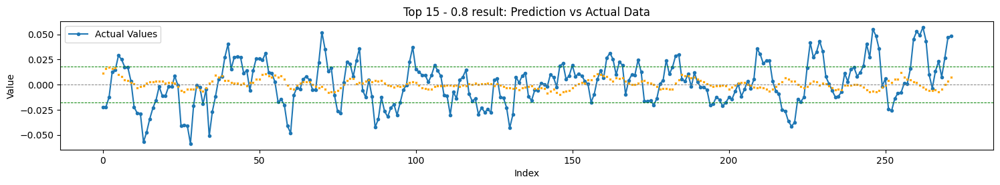

Total TH Pred.: 0


Top 1 - 0.9
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023227, inv. diff> 0.008990
Trend accuracy       : 60.219
Trend up accuracy    : 72.414
Trend down accuracy  : 46.512


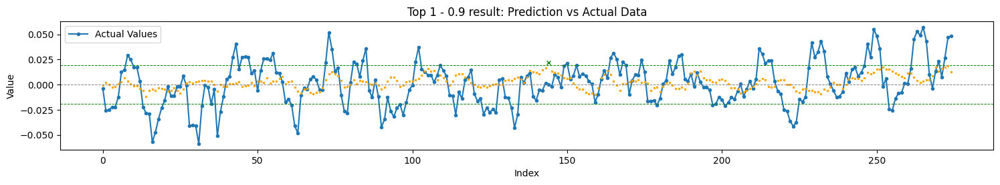

Total TH Pred.: 1
TH Pred. acc. : 100.00


Top 2 - 0.9
n_steps: 40, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023042, inv. diff> 0.009055
Trend accuracy       : 55.273
Trend up accuracy    : 67.123
Trend down accuracy  : 41.860


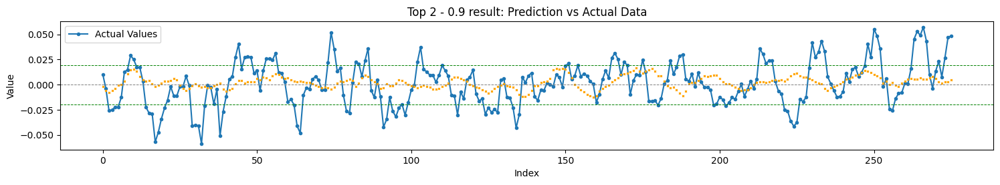

Total TH Pred.: 0


Top 3 - 0.9
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022646, inv. diff> 0.009343
Trend accuracy       : 57.934
Trend up accuracy    : 70.345
Trend down accuracy  : 43.651


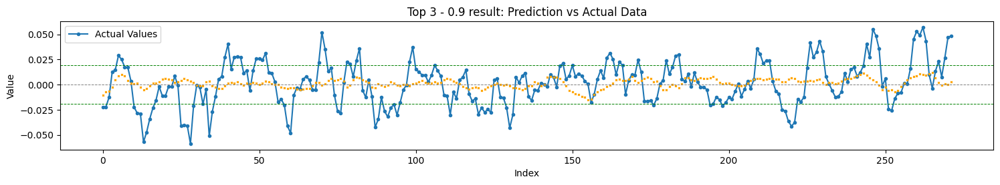

Total TH Pred.: 0


Top 4 - 0.9
n_steps: 120, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022539, inv. diff> 0.009104
Trend accuracy       : 57.565
Trend up accuracy    : 53.103
Trend down accuracy  : 62.698


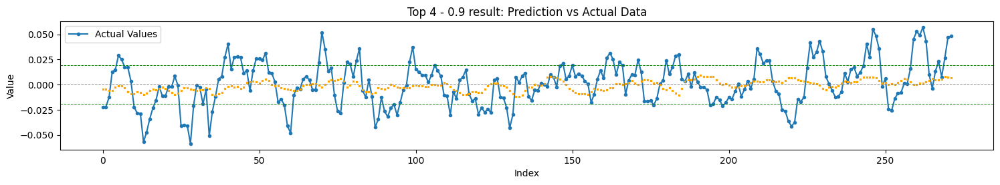

Total TH Pred.: 0


Top 5 - 0.9
n_steps: 60, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022581, inv. diff> 0.009311
Trend accuracy       : 52.190
Trend up accuracy    : 63.448
Trend down accuracy  : 39.535


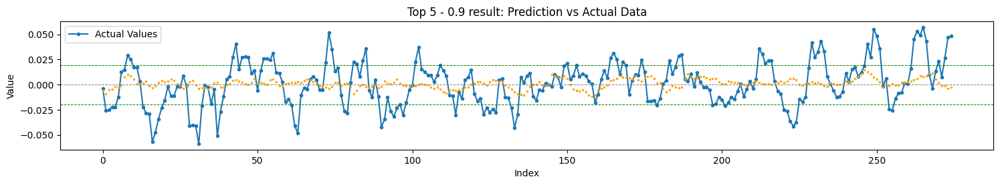

Total TH Pred.: 0


Top 6 - 0.9
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022194, inv. diff> 0.009755
Trend accuracy       : 57.299
Trend up accuracy    : 35.172
Trend down accuracy  : 82.171


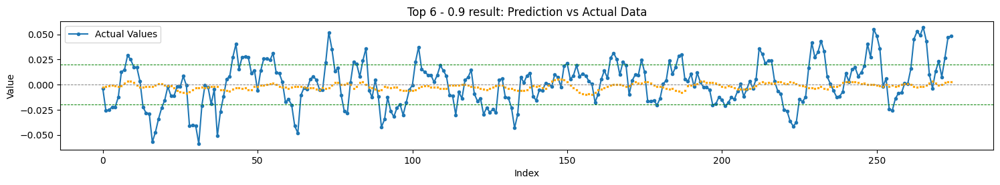

Total TH Pred.: 0


Top 7 - 0.9
n_steps: 120, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023370, inv. diff> 0.008988
Trend accuracy       : 60.517
Trend up accuracy    : 69.655
Trend down accuracy  : 50.000


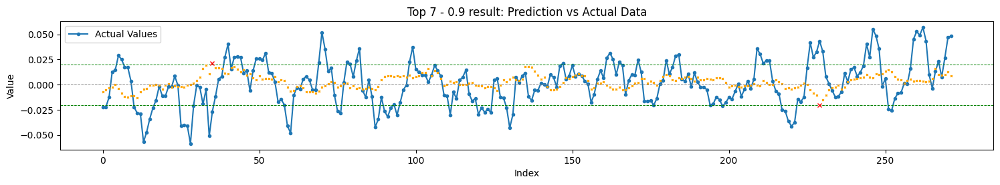

Total TH Pred.: 2
TH Pred. acc. : 0.00


Top 8 - 0.9
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022972, inv. diff> 0.009173
Trend accuracy       : 55.720
Trend up accuracy    : 73.793
Trend down accuracy  : 34.921


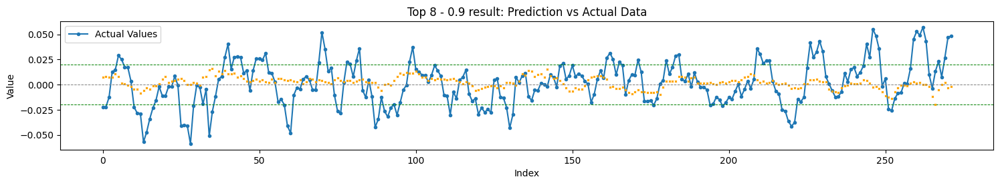

Total TH Pred.: 0


Top 9 - 0.9
n_steps: 40, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023179, inv. diff> 0.009253
Trend accuracy       : 56.727
Trend up accuracy    : 80.137
Trend down accuracy  : 30.233


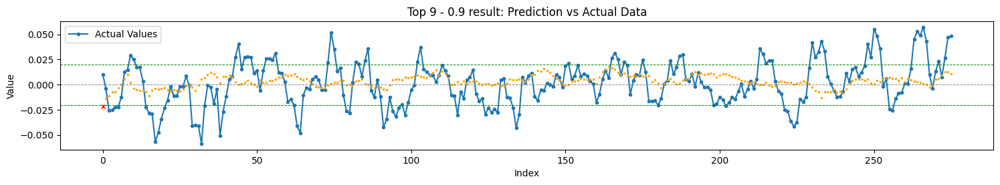

Total TH Pred.: 1
TH Pred. acc. : 0.00


Top 10 - 0.9
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023068, inv. diff> 0.008631
Trend accuracy       : 51.460
Trend up accuracy    : 40.000
Trend down accuracy  : 64.341


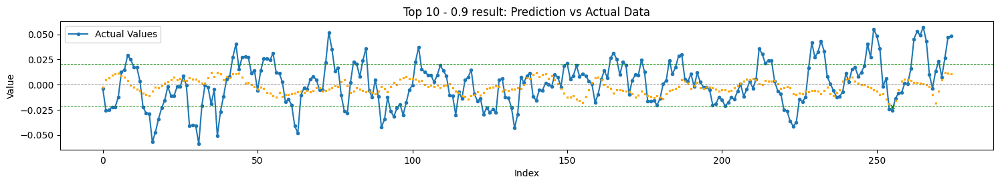

Total TH Pred.: 1
TH Pred. acc. : 100.00


Top 11 - 0.9
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023394, inv. diff> 0.008904
Trend accuracy       : 52.030
Trend up accuracy    : 63.448
Trend down accuracy  : 38.889


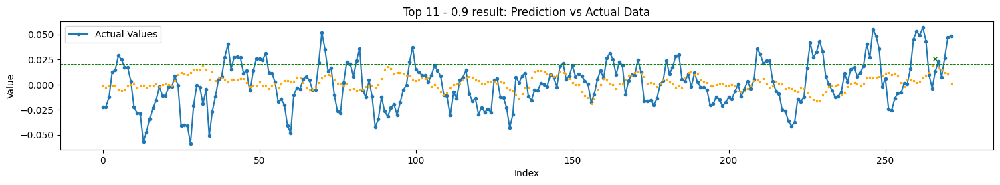

Total TH Pred.: 1
TH Pred. acc. : 100.00


Top 12 - 0.9
n_steps: 60, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022991, inv. diff> 0.009421
Trend accuracy       : 47.810
Trend up accuracy    : 74.483
Trend down accuracy  : 17.829


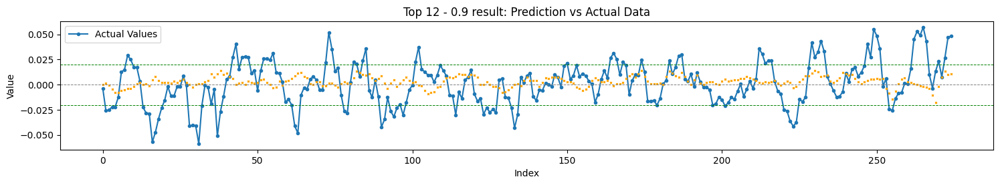

Total TH Pred.: 0


Top 13 - 0.9
n_steps: 40, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023994, inv. diff> 0.009694
Trend accuracy       : 55.636
Trend up accuracy    : 86.986
Trend down accuracy  : 20.155


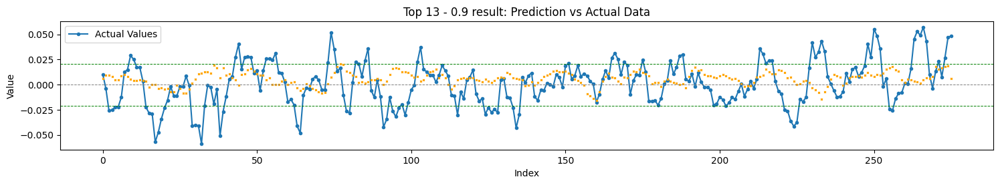

Total TH Pred.: 0


Top 14 - 0.9
n_steps: 40, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022545, inv. diff> 0.009047
Trend accuracy       : 51.273
Trend up accuracy    : 52.055
Trend down accuracy  : 50.388


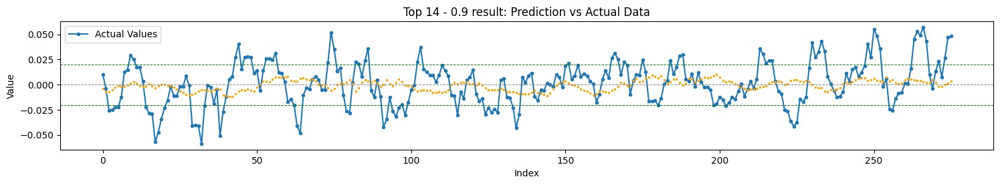

Total TH Pred.: 0


Top 15 - 0.9
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022610, inv. diff> 0.009219
Trend accuracy       : 51.661
Trend up accuracy    : 53.103
Trend down accuracy  : 50.000


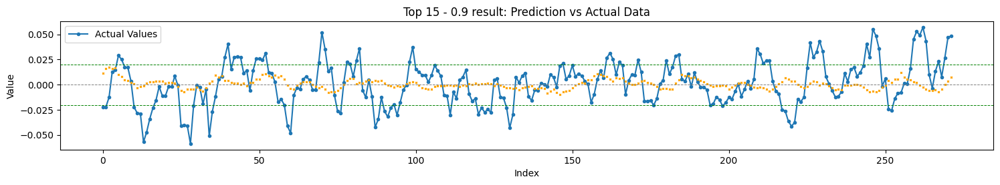

Total TH Pred.: 0


Top 1 - 1.0
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023227, inv. diff> 0.008990
Trend accuracy       : 60.219
Trend up accuracy    : 72.414
Trend down accuracy  : 46.512


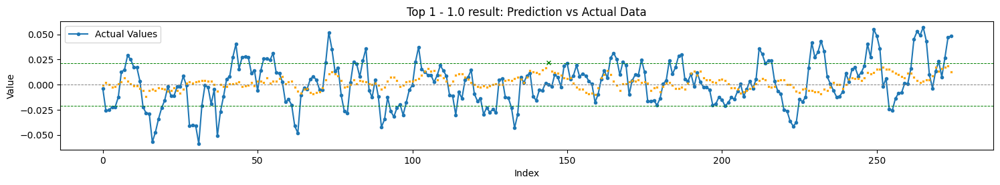

Total TH Pred.: 1
TH Pred. acc. : 100.00


Top 2 - 1.0
n_steps: 40, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023042, inv. diff> 0.009055
Trend accuracy       : 55.273
Trend up accuracy    : 67.123
Trend down accuracy  : 41.860


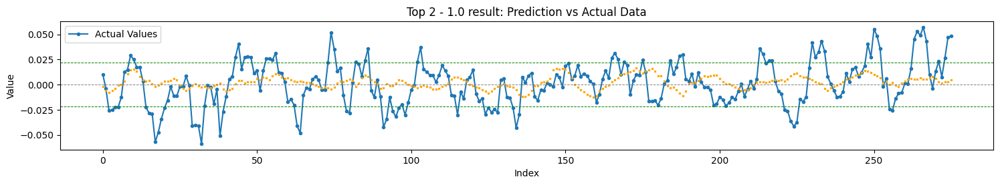

Total TH Pred.: 0


Top 3 - 1.0
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022646, inv. diff> 0.009343
Trend accuracy       : 57.934
Trend up accuracy    : 70.345
Trend down accuracy  : 43.651


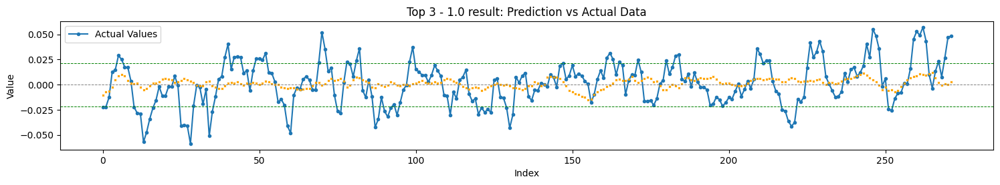

Total TH Pred.: 0


Top 4 - 1.0
n_steps: 120, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022539, inv. diff> 0.009104
Trend accuracy       : 57.565
Trend up accuracy    : 53.103
Trend down accuracy  : 62.698


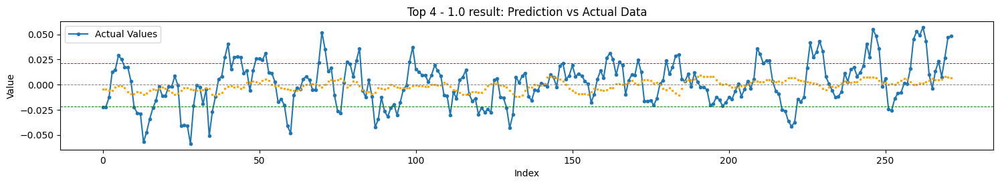

Total TH Pred.: 0


Top 5 - 1.0
n_steps: 60, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022581, inv. diff> 0.009311
Trend accuracy       : 52.190
Trend up accuracy    : 63.448
Trend down accuracy  : 39.535


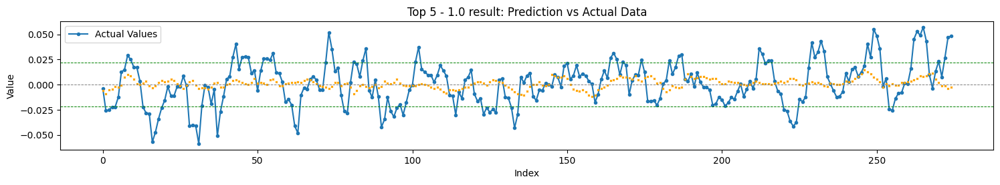

Total TH Pred.: 0


Top 6 - 1.0
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022194, inv. diff> 0.009755
Trend accuracy       : 57.299
Trend up accuracy    : 35.172
Trend down accuracy  : 82.171


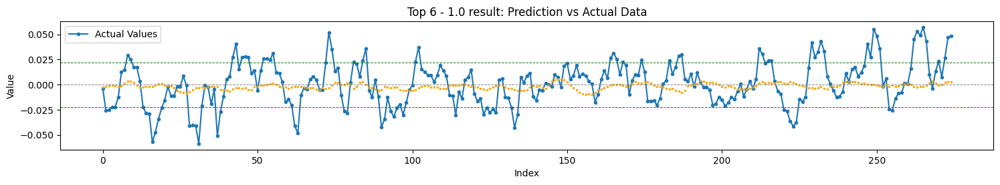

Total TH Pred.: 0


Top 7 - 1.0
n_steps: 120, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023370, inv. diff> 0.008988
Trend accuracy       : 60.517
Trend up accuracy    : 69.655
Trend down accuracy  : 50.000


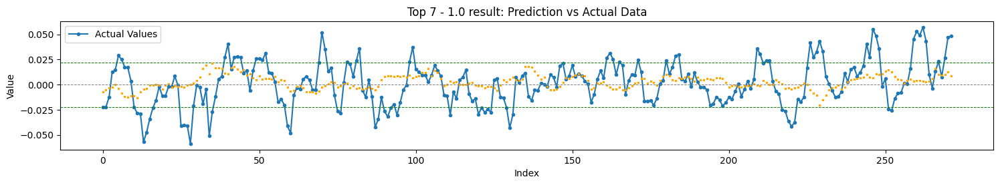

Total TH Pred.: 0


Top 8 - 1.0
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022972, inv. diff> 0.009173
Trend accuracy       : 55.720
Trend up accuracy    : 73.793
Trend down accuracy  : 34.921


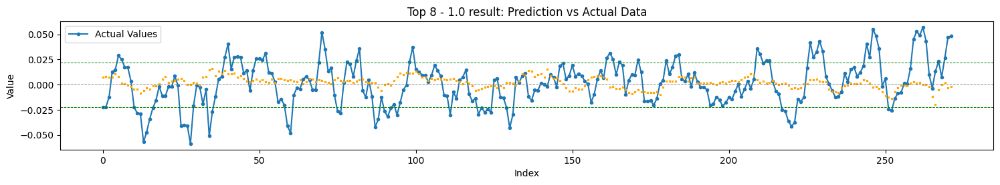

Total TH Pred.: 0


Top 9 - 1.0
n_steps: 40, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023179, inv. diff> 0.009253
Trend accuracy       : 56.727
Trend up accuracy    : 80.137
Trend down accuracy  : 30.233


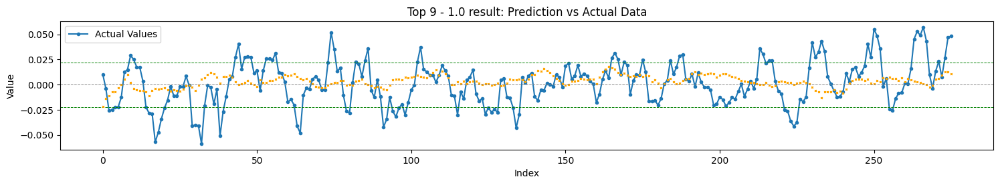

Total TH Pred.: 0


Top 10 - 1.0
n_steps: 60, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023068, inv. diff> 0.008631
Trend accuracy       : 51.460
Trend up accuracy    : 40.000
Trend down accuracy  : 64.341


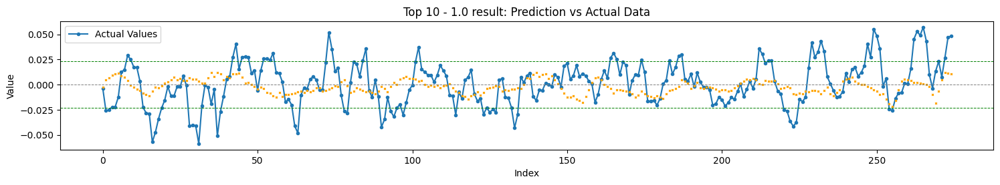

Total TH Pred.: 0


Top 11 - 1.0
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023394, inv. diff> 0.008904
Trend accuracy       : 52.030
Trend up accuracy    : 63.448
Trend down accuracy  : 38.889


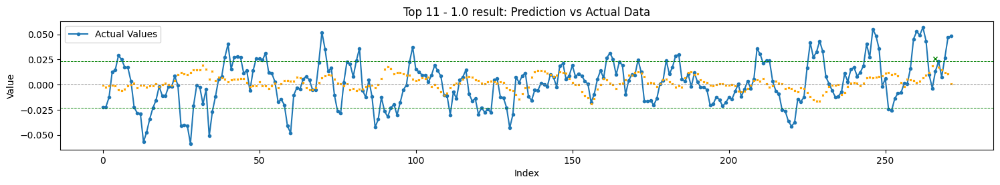

Total TH Pred.: 1
TH Pred. acc. : 100.00


Top 12 - 1.0
n_steps: 60, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022991, inv. diff> 0.009421
Trend accuracy       : 47.810
Trend up accuracy    : 74.483
Trend down accuracy  : 17.829


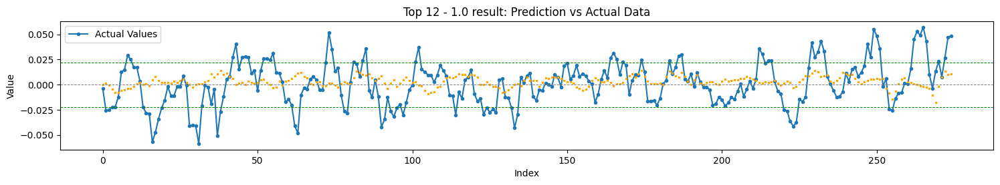

Total TH Pred.: 0


Top 13 - 1.0
n_steps: 40, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.GlorotUniform object at 0x711fe9e45390>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.023994, inv. diff> 0.009694
Trend accuracy       : 55.636
Trend up accuracy    : 86.986
Trend down accuracy  : 20.155


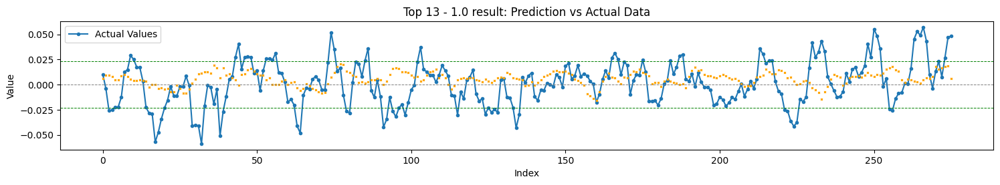

Total TH Pred.: 0


Top 14 - 1.0
n_steps: 40, batch_size: 128, epochs: 300
batch_size: 128, epochs: 300
Model params:  {'lstm_units1': 75, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022545, inv. diff> 0.009047
Trend accuracy       : 51.273
Trend up accuracy    : 52.055
Trend down accuracy  : 50.388


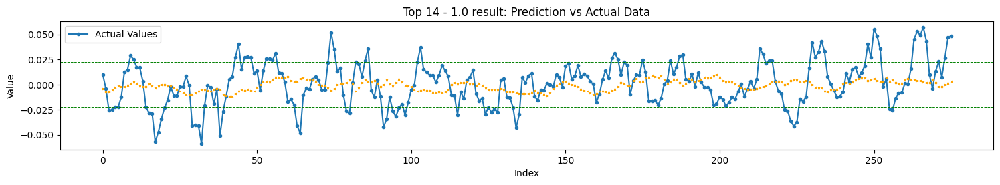

Total TH Pred.: 0


Top 15 - 1.0
n_steps: 120, batch_size: 256, epochs: 300
batch_size: 256, epochs: 300
Model params:  {'lstm_units1': 25, 'lstm_units2': 25, 'activation': 'relu', 'dropout': 0.15, 'num_layers': 2, 'initializer': <keras.src.initializers.initializers.Orthogonal object at 0x711fe9e46e90>}
Feature list:  ['LMCADS03', 'LMCADY', 'SPX', 'MXWD', 'XAG', 'XAU', 'ACU_5D', 'ACU_4D', 'ACU_3D', 'ACU_2D']
Inv. rmse> 0.022610, inv. diff> 0.009219
Trend accuracy       : 51.661
Trend up accuracy    : 53.103
Trend down accuracy  : 50.000


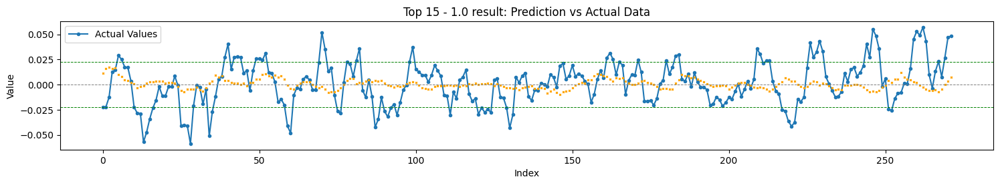

Total TH Pred.: 0




In [20]:
for mult in [.3,.4,.5,.6,.7,.8,.9,1.0]:
    for i,result in enumerate(top_results_sort,1):

        # if result['rmse']-result['std_dev'] >= 0:
        #     continue

        print(f"Top {i} - {mult}")

        # if (result['rmse']<result['std_dev']):
        #     result['diff'] = result['rmse']-result['std_dev'] + abs(np.std(result['predictions']) - result['std_dev'])/4.0
        # else:
        #     result['diff'] = (result['rmse']- result['std_dev']) + abs(np.std(result['predictions']) - result['std_dev'])/2.0

        # print("RMSE: {:.6f}, STD_DEV: {:.6f}, STD_PRD: {:.6f}, OBJDIFF: {:.6f}, RDIFF: {:.6f}".format(result['rmse'], result['std_dev'], np.std(result['predictions']), result['diff'],result['rmse']-result['std_dev']))
        print("n_steps: {}, batch_size: {}, epochs: {}".format(result['n_steps'], result['batch_size'], result['epochs']))
        print("batch_size: {}, epochs: {}".format(result['batch_size'], result['epochs']))
        print("Model params: ", result['md_prm'])
        print("Feature list: ", result['feature_list'])

        # var_tot     = set(variable_options)
        # fea_list    = set(result['feature_list'])
        # print("Discarded var: {}".format(var_tot - fea_list))

        result['inv_rmse'] = inv_rmse = rmse(result['true_values'], result['predictions']*-1)
        inv_diff = (inv_rmse - result['std_dev']) + abs(np.std(result['predictions']) - result['std_dev'])/2.0
        print("Inv. rmse> {:.6f}, inv. diff> {:.6f}".format(inv_rmse, inv_diff))

        # calculate trend prediction percentage

        trend_up_true   = 0
        trend_down_true = 0
        trend_up_pred   = 0
        trend_down_pred = 0

        for j in range(len(result['true_values'])-1):
            if result['true_values'][j] > 0.0:
                trend_up_pred += 1
                if result['predictions'][j] > 0.0:
                    trend_up_true += 1
            if result['true_values'][j] < 0.0:
                trend_down_pred += 1
                if result['predictions'][j] < 0.0:
                    trend_down_true += 1

        trend_true      = trend_up_true + trend_down_true
        trend_pred      = trend_up_pred + trend_down_pred
        trend_accuracy  = trend_true/trend_pred
        print("Trend accuracy       : {:.3f}".format(trend_accuracy*100))
        print("Trend up accuracy    : {:.3f}".format(trend_up_true*100/trend_up_pred))
        print("Trend down accuracy  : {:.3f}".format(trend_down_true*100/trend_down_pred))


        tot_pred, prof, loss = plot_predictions(result['true_values'], result['predictions'],-1, title=f"Top {i} - {mult} result: Prediction vs Actual Data",rmse=result['rmse']*mult)
        print("Total TH Pred.: {}".format(tot_pred))
        if tot_pred != 0:
            print("TH Pred. acc. : {:.2f}".format(prof*100.0/tot_pred))
        print('\n')


In [18]:
# export the best result predictions and true values to a csv file
best_result = top_results[6]
best_result_df = pd.DataFrame({'True Values': best_result['true_values'], 'Predictions': best_result['predictions'].flatten()})
best_result_df.to_csv('../output/lstm_best_result.csv', index=False)